# Coursework 2: Generative Models

## Instructions

### Submission
Please submit one zip file on cate - *CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells**
2. Your trained VAE model as *VAE_model.pth*
3. Your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*


### Training
Training the GAN will take quite a long time (multiple hours), please refer to the 4 GPU options detailed in the logistics lecture. Some additional useful pointers:
* PaperSpace [guide if you need more compute](https://hackmd.io/@afspies/S1stL8Qnt)
* Lab GPUs via SSH.  The VSCode Remote Develop extension is recommended for this. For general Imperial remote working instructions see [this post](https://www.doc.ic.ac.uk/~nuric/teaching/remote-working-for-imperial-computing-students.html). You'll also want to [setup your environment as outlined here](https://hackmd.io/@afspies/Bkd7Zq60K).
* Use Colab and add checkpointing to the model training code; this is to handle the case where colab stops a free-GPU kernel after a certain number of hours (~4).
* Use Colab Pro - If you do not wish to use PaperSpace then you can pay for Colab Pro. We cannot pay for this on your behalf (this is Google's fault).


### Testing
TAs will run a testing cell (at the end of this notebook), so you are required to copy your data ```transform``` and ```denorm``` functions to a cell near the bottom of the document (it is demarkated). You are advised to check that your implementations pass these tests (in particular, the jit saving and loading may not work for certain niche functions)

### General
You can feel free to add architectural alterations / custom functions outside of pre-defined code blocks, but if you manipulate the model's inputs in some way, please include the same code in the TA test cell, so our tests will run easily.

<font color="orange">**The deadline for submission is Monday, 26 Feb by 6 pm** </font>

## Setting up working environment
You will need to install pytorch and import some utilities by running the following cell:

In [5]:
!pip install -q torch torchvision altair seaborn
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
from pathlib import Path
import tqdm

fatal: destination path 'icl_dl_cw2_utils' already exists and is not an empty directory.


Here we have some default pathing options which vary depending on the environment you are using. You can of course change these as you please.

In [6]:
# Initialization Cell
WORKING_ENV = 'COLAB' # Can be LABS, COLAB, PAPERSPACE, SAGEMAKER
USERNAME = '' # If working on Lab Machines - Your college username
assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE', 'SAGEMAKER']

if WORKING_ENV == 'COLAB':
    from google.colab import drive
    %load_ext google.colab.data_table
    dl_cw2_repo_path = 'dl_cw2/' # path in your gdrive to the repo
    content_path = f'/content/drive/MyDrive/{dl_cw2_repo_path}' # path to gitrepo in gdrive after mounting
    data_path = './data/' # save the data locally
    drive.mount('/content/drive/') # Outputs will be saved in your google drive

elif WORKING_ENV == 'LABS':
    content_path = f'/vol/bitbucket/{USERNAME}/dl/dl_cw2/' # You may want to change this
    data_path = f'/vol/bitbucket/{USERNAME}/dl/'
    # Your python env and training data should be on bitbucket
    if 'vol/bitbucket' not in content_path or 'vol/bitbucket' not in data_path:
        import warnings
        warnings.warn(
           'It is best to create a dir in /vol/bitbucket/ otherwise you will quickly run into memory issues'
           )
elif WORKING_ENV == 'PAPERSPACE': # Using Paperspace
    # Paperspace does not properly render animated progress bars
    # Strongly recommend using the JupyterLab UI instead of theirs
    !pip install ipywidgets
    content_path = '/notebooks/'
    data_path = './data/'

elif WORKING_ENV == 'SAGEMAKER':
    content_path = '/home/studio-lab-user/sagemaker-studiolab-notebooks/dl/'
    data_path = f'{content_path}data/'

else:
  raise NotImplementedError()

content_path = Path(content_path)

Mounted at /content/drive/


## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points.

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. More marks are awarded for using a Convolutional Encoder and Decoder.

b. Design an appropriate loss function and train the model.


In [7]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_VAE/'):
    os.makedirs(content_path/'CW_VAE/')

if not os.path.exists(data_path):
    os.makedirs(data_path)

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
### Hyper-parameter selection


In [8]:
# Necessary Hyperparameters
num_epochs = 20
learning_rate = 0.001
batch_size = 64
latent_dim = 20 # Choose a value for the size of the latent space

# Additional Hyperparameters


# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [9]:
train_dat = datasets.MNIST(
    data_path, train=True, download=True, transform=transform
)
test_dat = datasets.MNIST(data_path, train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, content_path/'CW_VAE/image_original.png')

100%|██████████| 9912422/9912422 [00:00<00:00, 379863783.54it/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 38164994.90it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 202734775.50it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 5370884.91it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [10]:
# *CODE FOR PART 1.1a IN THIS CELL*
input_channels = 1 #grayscale
output_channels = 32 # the number of filters the convolutional layer will learn. More filters can capture a richer set of features
kernel_size = 3 #size of the convolutional filter,standard for capturing local patterns
stride=2 #stride with which the filter is applied. reduces the spatial dimensions of the output by half, downsampling
padding=1 #added to the input to allow the convolution to process the edge


output_channels_2 = 64
fc_1 = 1024
#two stride-2 convolutions on 28x28 input images, the spatial dimensions are reduced to 7x7
height_reshape = 7
width_reshape = 7

class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(input_channels, output_channels, kernel_size, stride,
                      padding),
            nn.BatchNorm2d(output_channels), ##number of features (or channels) to normalize. This matches the number of output channels from the previous convolutional layer
            nn.ReLU(),

            nn.Conv2d(output_channels, output_channels_2, kernel_size, stride,
                      padding),
            nn.BatchNorm2d(output_channels_2),
            nn.ReLU(),


            nn.Flatten(),
            #the size of the compressed representation.
            nn.Linear(output_channels_2 * height_reshape * width_reshape, fc_1),
            nn.ReLU(),
        )
        self.fc_mu = nn.Linear(fc_1, latent_dim)
        self.fc_logvar = nn.Linear(fc_1, latent_dim)

        # Decoder
        # reversing the operation of the last layer of the encoder.
        self.decoder_input = nn.Linear(latent_dim, fc_1)

        self.decoder = nn.Sequential(
            #reverses the flattening operation in the encoder
            # for convolutional transpose layers.
            nn.Linear(fc_1, output_channels_2 * height_reshape * width_reshape),
            nn.ReLU(),

            nn.Unflatten(1, (output_channels_2,height_reshape,width_reshape )),
            #matching the output of the corresponding encoder layer
            nn.ConvTranspose2d(output_channels_2, output_channels, kernel_size,
                               stride, padding, output_padding=1),
            nn.BatchNorm2d(output_channels),
            nn.ReLU(),

            nn.ConvTranspose2d(output_channels, input_channels, kernel_size,
                               stride, padding, output_padding=1),
            nn.Sigmoid(),  # Use sigmoid for MNIST to output values between 0 and 1
        )

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        h = self.encoder(x)
        #passes the input x (an image or batch of images) through the encoder network
        #downsample the input and transform it into a high-level feature representation h

        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar
        #These layers transform h into two vectors: one representing the mean (mu) and
        #one representing the logarithm of the variance (logvar) of the latent variables

        #define the parameters of the Gaussian distribution

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        #exponential to get the variance and then compute the square root
        std = torch.exp(0.5*logvar)
        #Generates a tensor of random numbers from a standard normal distribution
        #with the same shape
        eps = torch.randn_like(std)
        #scaling the random eps tensor by std and shifting the distribution by mu
        z = mu + eps*std
        return z
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        h = self.decoder_input(z)
        #rogressively upsample h to reconstruct the input image
        return self.decoder(h)
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        mu, logvar = self.encode(x)
        z = self.reparametrize(mu, logvar)
        return self.decode(z), mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 6527017
VAE(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Flatten(start_dim=1, end_dim=-1)
    (7): Linear(in_features=3136, out_features=1024, bias=True)
    (8): ReLU()
  )
  (fc_mu): Linear(in_features=1024, out_features=20, bias=True)
  (fc_logvar): Linear(in_features=1024, out_features=20, bias=True)
  (decoder_input): Linear(in_features=20, out_features=1024, bias=True)
  (decoder): Sequential(
    (0): Linear(in_features=1024, out_features=3136, bias=True)
    (1): ReLU()
    (2): Unflatten(dim=1, unflattened_size=(64, 7, 7))
    (3): ConvTranspose2d(64, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1)

---

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [11]:
# *CODE FOR PART 1.1b IN THIS CELL*

def loss_function_VAE(recon_x, x, mu, logvar, beta):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
     # Binary Cross Entropy between the target and the output
    reconstruct_loss = F.binary_cross_entropy(recon_x, x,reduction='sum')

    #kl_divergence = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    kl_divergence = torch.sum(torch.exp(logvar) + mu**2 -logvar - 1.0) / 2

    loss = reconstruct_loss + beta * kl_divergence

    return loss, kl_divergence,reconstruct_loss
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################


        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

#track the average loss per sample --?
beta_values = [0.2, 0.9, 5]
beta_losses = {beta: {'train_losses': [], 'train_klds': [], 'train_reconstruction_losses': [],
        'test_losses': [],'test_klds': [], 'test_reconstruction_losses': [],} for beta in beta_values}

def train_and_test(model, loader_train, loader_test, beta, num_epochs):
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

    # Initialize
    train_losses = []
    train_klds = []
    train_reconstruction_losses = []

    test_losses = []
    test_klds = []
    test_reconstruction_losses = []

    for epoch in range(num_epochs):
        ##################TRAIN#####################################################
        model.train()
        train_loss = 0.0
        train_kld = 0.0
        train_reconstruction_loss = 0.0

        with tqdm.tqdm(loader_train, unit="batch") as tepoch:
           for batch_idx, (data, _) in enumerate(tepoch):
              data = data.to(device)
              optimizer.zero_grad()
              recon_batch, mu, logvar = model(data)
              loss, kld, reconstruction_loss = loss_function_VAE(recon_batch, data,
                                                                mu, logvar, beta)
              loss.backward()
              optimizer.step()
              #average loss per sample per batch
              train_loss += loss.item() / data.shape[0] # Normalizing by batch size
              train_kld += kld.item() / data.shape[0]
              train_reconstruction_loss += reconstruction_loss.item() / data.shape[0]


              if batch_idx % 20 == 0:
                  tepoch.set_description(f"Train Epoch {epoch}")
                  tepoch.set_postfix(loss=loss.item()/len(data))

        train_losses.append(train_loss / len(loader_train.dataset))
        train_klds.append(train_kld / len(loader_train.dataset))
        train_reconstruction_losses.append(train_reconstruction_loss / len(loader_train.dataset))

        print(f"Train Epoch {epoch}: Avg Train Loss: {train_loss / len(loader_train.dataset)}, "
          f"Avg Train KLD: {train_kld / len(loader_train.dataset)}, "
          f"Avg Train Reconstruction Loss: {train_reconstruction_loss / len(loader_train.dataset)}")

        ##################TEST#####################################################
        model.eval()

        test_loss = 0.0
        test_kld= 0.0
        test_reconstruction_loss = 0.0

        with torch.no_grad(),tqdm.tqdm(loader_test, unit="batch") as tepoch:
          for batch_idx, (data, _) in enumerate(tepoch):
              data = data.to(device)
              recon_batch, mu, logvar = model(data)
              loss, kld, reconstruction_loss = loss_function_VAE(recon_batch,
                                                                  data, mu,
                                                                  logvar, beta)

              test_loss += loss.item() /data.shape[0]
              test_kld += kld.item() / data.shape[0]
              test_reconstruction_loss += reconstruction_loss.item() / data.shape[0]

              if batch_idx % 20 == 0:
                tepoch.set_description(f"Test Epoch {epoch}")
                tepoch.set_postfix(loss=loss.item() / len(data))

        test_losses.append(test_loss / len(loader_test.dataset))
        test_reconstruction_losses.append(test_reconstruction_loss /
                                      len(loader_test.dataset))
        test_klds.append(test_kld / len(loader_test.dataset))

        print(f"Test Epoch {epoch}: Avg Test Loss: {test_loss / len(loader_test.dataset)}, "
          f"Avg Test KLD: {test_kld / len(loader_test.dataset)}, "
          f"Avg Test Reconstruction Loss: {test_reconstruction_loss / len(loader_test.dataset)}")

        # Save the model at the end of training
        if epoch == num_epochs - 1:
            torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                           content_path/'CW_VAE/VAE_model.pth')

    return {
        'train_losses': train_losses,
        'train_klds': train_klds,
        'train_reconstruction_losses': train_reconstruction_losses,
        'test_losses': test_losses,
        'test_klds': test_klds,
        'test_reconstruction_losses': test_reconstruction_losses
    }

##################BETA TESTING##################################################
for beta in beta_values:
    # Reset
    model = VAE(latent_dim).to(device)
    #optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

    #training and testing
    loss_dict = train_and_test(model, loader_train, loader_test, beta, 10)

    # Store
    beta_losses[beta]['train_losses'] = loss_dict['train_losses']
    beta_losses[beta]['test_losses'] = loss_dict['test_losses']

    beta_losses[beta]['train_klds'] = loss_dict['train_klds']
    beta_losses[beta]['test_klds'] = loss_dict['test_klds']

    beta_losses[beta]['train_reconstruction_losses'] = loss_dict['train_reconstruction_losses']
    beta_losses[beta]['test_reconstruction_losses'] = loss_dict['test_reconstruction_losses']


###########BEST MODEL##################################################
model = VAE(latent_dim).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

#training and testing
losses_best = train_and_test(model, loader_train, loader_test, 0.9, num_epochs)

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################


Train Epoch 0: 100%|██████████| 938/938 [00:13<00:00, 68.82batch/s, loss=80.2]


Train Epoch 0: Avg Train Loss: 1.7279689575195312, Avg Train KLD: 0.6541967908968528, Avg Train Reconstruction Loss: 1.5971295988718668


Test Epoch 0: 100%|██████████| 157/157 [00:01<00:00, 100.41batch/s, loss=85.8]


Test Epoch 0: Avg Test Loss: 1.2845298828125, Avg Test KLD: 0.7068946678161621, Avg Test Reconstruction Loss: 1.1431509494781493


Train Epoch 1: 100%|██████████| 938/938 [00:11<00:00, 83.96batch/s, loss=77.9]


Train Epoch 1: Avg Train Loss: 1.2497253330230713, Avg Train KLD: 0.6978374106089275, Avg Train Reconstruction Loss: 1.1101578512827555


Test Epoch 1: 100%|██████████| 157/157 [00:01<00:00, 115.96batch/s, loss=82.6]


Test Epoch 1: Avg Test Loss: 1.2338607238769532, Avg Test KLD: 0.712116822052002, Avg Test Reconstruction Loss: 1.0914373626708984


Train Epoch 2: 100%|██████████| 938/938 [00:11<00:00, 84.04batch/s, loss=74.8]


Train Epoch 2: Avg Train Loss: 1.2121688465118408, Avg Train KLD: 0.7043498208363851, Avg Train Reconstruction Loss: 1.071298882293701


Test Epoch 2: 100%|██████████| 157/157 [00:01<00:00, 117.64batch/s, loss=80.3]


Test Epoch 2: Avg Test Loss: 1.208280711364746, Avg Test KLD: 0.7136037899017333, Avg Test Reconstruction Loss: 1.0655599502563478


Train Epoch 3: 100%|██████████| 938/938 [00:11<00:00, 82.73batch/s, loss=72.8]


Train Epoch 3: Avg Train Loss: 1.1924409669240317, Avg Train KLD: 0.7071481008529663, Avg Train Reconstruction Loss: 1.0510113464355468


Test Epoch 3: 100%|██████████| 157/157 [00:01<00:00, 115.62batch/s, loss=78.8]


Test Epoch 3: Avg Test Loss: 1.1864454078674316, Avg Test KLD: 0.712688383102417, Avg Test Reconstruction Loss: 1.0439077297210693


Train Epoch 4: 100%|██████████| 938/938 [00:11<00:00, 83.43batch/s, loss=79]


Train Epoch 4: Avg Train Loss: 1.1794494669596354, Avg Train KLD: 0.7090328921635946, Avg Train Reconstruction Loss: 1.0376428864161173


Test Epoch 4: 100%|██████████| 157/157 [00:01<00:00, 115.41batch/s, loss=78.4]


Test Epoch 4: Avg Test Loss: 1.1778722152709962, Avg Test KLD: 0.7150963047027588, Avg Test Reconstruction Loss: 1.034852961730957


Train Epoch 5: 100%|██████████| 938/938 [00:11<00:00, 83.26batch/s, loss=75.5]


Train Epoch 5: Avg Train Loss: 1.1706244644165038, Avg Train KLD: 0.7101752408981323, Avg Train Reconstruction Loss: 1.0285894152323405


Test Epoch 5: 100%|██████████| 157/157 [00:01<00:00, 118.53batch/s, loss=78.2]


Test Epoch 5: Avg Test Loss: 1.1720343170166017, Avg Test KLD: 0.7215931251525879, Avg Test Reconstruction Loss: 1.0277156951904296


Train Epoch 6: 100%|██████████| 938/938 [00:11<00:00, 83.70batch/s, loss=72.1]


Train Epoch 6: Avg Train Loss: 1.1626295758565266, Avg Train KLD: 0.7108612714767456, Avg Train Reconstruction Loss: 1.0204573209762573


Test Epoch 6: 100%|██████████| 157/157 [00:01<00:00, 117.87batch/s, loss=78.1]


Test Epoch 6: Avg Test Loss: 1.168839963531494, Avg Test KLD: 0.7222957248687745, Avg Test Reconstruction Loss: 1.0243808185577392


Train Epoch 7: 100%|██████████| 938/938 [00:11<00:00, 83.53batch/s, loss=73.5]


Train Epoch 7: Avg Train Loss: 1.1557114316304524, Avg Train KLD: 0.7099470796585083, Avg Train Reconstruction Loss: 1.0137220170974732


Test Epoch 7: 100%|██████████| 157/157 [00:01<00:00, 118.09batch/s, loss=77.1]


Test Epoch 7: Avg Test Loss: 1.156173681640625, Avg Test KLD: 0.7050758457183838, Avg Test Reconstruction Loss: 1.0151585166931152


Train Epoch 8: 100%|██████████| 938/938 [00:11<00:00, 83.12batch/s, loss=71.6]


Train Epoch 8: Avg Train Loss: 1.1504726048787435, Avg Train KLD: 0.7102648752848307, Avg Train Reconstruction Loss: 1.0084196287790934


Test Epoch 8: 100%|██████████| 157/157 [00:01<00:00, 116.96batch/s, loss=77.7]


Test Epoch 8: Avg Test Loss: 1.1553745491027831, Avg Test KLD: 0.7142573505401612, Avg Test Reconstruction Loss: 1.012523080444336


Train Epoch 9: 100%|██████████| 938/938 [00:11<00:00, 82.77batch/s, loss=74.1]


Train Epoch 9: Avg Train Loss: 1.1457967439015706, Avg Train KLD: 0.7104853325525919, Avg Train Reconstruction Loss: 1.0036996775945028


Test Epoch 9: 100%|██████████| 157/157 [00:01<00:00, 117.86batch/s, loss=76.5]


Test Epoch 9: Avg Test Loss: 1.1520424835205079, Avg Test KLD: 0.7046972126007081, Avg Test Reconstruction Loss: 1.011103037261963


Train Epoch 0: 100%|██████████| 938/938 [00:11<00:00, 84.05batch/s, loss=106]


Train Epoch 0: Avg Train Loss: 2.1510605553944906, Avg Train KLD: 0.3503595135440429, Avg Train Reconstruction Loss: 1.835737004216512


Test Epoch 0: 100%|██████████| 157/157 [00:01<00:00, 112.82batch/s, loss=112]


Test Epoch 0: Avg Test Loss: 1.6823432006835937, Avg Test KLD: 0.39893807182312013, Avg Test Reconstruction Loss: 1.3232989463806153


Train Epoch 1: 100%|██████████| 938/938 [00:11<00:00, 83.32batch/s, loss=100]


Train Epoch 1: Avg Train Loss: 1.6361576824188233, Avg Train KLD: 0.4052250804901123, Avg Train Reconstruction Loss: 1.27145512008667


Test Epoch 1: 100%|██████████| 157/157 [00:01<00:00, 111.19batch/s, loss=109]


Test Epoch 1: Avg Test Loss: 1.6127877754211426, Avg Test KLD: 0.41909928379058836, Avg Test Reconstruction Loss: 1.2355984252929688


Train Epoch 2: 100%|██████████| 938/938 [00:11<00:00, 83.74batch/s, loss=100]


Train Epoch 2: Avg Train Loss: 1.5968433490753173, Avg Train KLD: 0.40804453172683713, Avg Train Reconstruction Loss: 1.2296032808939616


Test Epoch 2: 100%|██████████| 157/157 [00:01<00:00, 116.98batch/s, loss=106]


Test Epoch 2: Avg Test Loss: 1.5780699584960938, Avg Test KLD: 0.4110787986755371, Avg Test Reconstruction Loss: 1.208099048614502


Train Epoch 3: 100%|██████████| 938/938 [00:11<00:00, 83.45batch/s, loss=97.9]


Train Epoch 3: Avg Train Loss: 1.5751315081278483, Avg Train KLD: 0.40833930842081706, Avg Train Reconstruction Loss: 1.2076261383056641


Test Epoch 3: 100%|██████████| 157/157 [00:01<00:00, 117.48batch/s, loss=105]


Test Epoch 3: Avg Test Loss: 1.5619214752197266, Avg Test KLD: 0.4090926128387451, Avg Test Reconstruction Loss: 1.1937381340026856


Train Epoch 4: 100%|██████████| 938/938 [00:11<00:00, 83.43batch/s, loss=96.3]


Train Epoch 4: Avg Train Loss: 1.5604119176228841, Avg Train KLD: 0.40760570526123047, Avg Train Reconstruction Loss: 1.193566794204712


Test Epoch 4: 100%|██████████| 157/157 [00:01<00:00, 120.26batch/s, loss=104]


Test Epoch 4: Avg Test Loss: 1.5585458068847655, Avg Test KLD: 0.4021664789199829, Avg Test Reconstruction Loss: 1.1965959854125976


Train Epoch 5: 100%|██████████| 938/938 [00:11<00:00, 84.55batch/s, loss=94.8]


Train Epoch 5: Avg Train Loss: 1.5493323088328044, Avg Train KLD: 0.40744403670628865, Avg Train Reconstruction Loss: 1.1826326859792073


Test Epoch 5: 100%|██████████| 157/157 [00:01<00:00, 117.09batch/s, loss=102]


Test Epoch 5: Avg Test Loss: 1.5451556030273437, Avg Test KLD: 0.4019782375335693, Avg Test Reconstruction Loss: 1.1833751976013183


Train Epoch 6: 100%|██████████| 938/938 [00:11<00:00, 83.72batch/s, loss=103]


Train Epoch 6: Avg Train Loss: 1.540824163309733, Avg Train KLD: 0.4066528980255127, Avg Train Reconstruction Loss: 1.1748365676879884


Test Epoch 6: 100%|██████████| 157/157 [00:01<00:00, 116.10batch/s, loss=103]


Test Epoch 6: Avg Test Loss: 1.5406552856445312, Avg Test KLD: 0.41355080223083496, Avg Test Reconstruction Loss: 1.1684595756530762


Train Epoch 7: 100%|██████████| 938/938 [00:11<00:00, 83.95batch/s, loss=102]


Train Epoch 7: Avg Train Loss: 1.5326162743886311, Avg Train KLD: 0.4054517060915629, Avg Train Reconstruction Loss: 1.1677097494761148


Test Epoch 7: 100%|██████████| 157/157 [00:01<00:00, 119.54batch/s, loss=102]


Test Epoch 7: Avg Test Loss: 1.5345146934509277, Avg Test KLD: 0.4033685688018799, Avg Test Reconstruction Loss: 1.1714829902648927


Train Epoch 8: 100%|██████████| 938/938 [00:11<00:00, 82.57batch/s, loss=95.9]


Train Epoch 8: Avg Train Loss: 1.526590910720825, Avg Train KLD: 0.4045347709973653, Avg Train Reconstruction Loss: 1.1625096270243327


Test Epoch 8: 100%|██████████| 157/157 [00:01<00:00, 116.78batch/s, loss=102]


Test Epoch 8: Avg Test Loss: 1.5305245048522949, Avg Test KLD: 0.40878445644378664, Avg Test Reconstruction Loss: 1.1626185089111327


Train Epoch 9: 100%|██████████| 938/938 [00:11<00:00, 83.73batch/s, loss=98.2]


Train Epoch 9: Avg Train Loss: 1.521151319249471, Avg Train KLD: 0.4036034760475159, Avg Train Reconstruction Loss: 1.1579082018534343


Test Epoch 9: 100%|██████████| 157/157 [00:01<00:00, 116.20batch/s, loss=102]


Test Epoch 9: Avg Test Loss: 1.5260235015869141, Avg Test KLD: 0.3997589672088623, Avg Test Reconstruction Loss: 1.1662404418945314


Train Epoch 0: 100%|██████████| 938/938 [00:11<00:00, 83.34batch/s, loss=166]


Train Epoch 0: Avg Train Loss: 2.9923384195963543, Avg Train KLD: 0.06682799125661452, Avg Train Reconstruction Loss: 2.658198462041219


Test Epoch 0: 100%|██████████| 157/157 [00:01<00:00, 118.09batch/s, loss=169]


Test Epoch 0: Avg Test Loss: 2.5656856170654296, Avg Test KLD: 0.09406301245689393, Avg Test Reconstruction Loss: 2.0953705612182616


Train Epoch 1: 100%|██████████| 938/938 [00:11<00:00, 83.06batch/s, loss=158]


Train Epoch 1: Avg Train Loss: 2.526643190511068, Avg Train KLD: 0.10179181752999623, Avg Train Reconstruction Loss: 2.017684103012085


Test Epoch 1: 100%|██████████| 157/157 [00:01<00:00, 116.81batch/s, loss=166]


Test Epoch 1: Avg Test Loss: 2.4971908950805664, Avg Test KLD: 0.10386012673377991, Avg Test Reconstruction Loss: 1.9778902549743653


Train Epoch 2: 100%|██████████| 938/938 [00:11<00:00, 83.77batch/s, loss=153]


Train Epoch 2: Avg Train Loss: 2.4803030133565267, Avg Train KLD: 0.10891300544738769, Avg Train Reconstruction Loss: 1.935737987391154


Test Epoch 2: 100%|██████████| 157/157 [00:01<00:00, 119.24batch/s, loss=161]


Test Epoch 2: Avg Test Loss: 2.4633876876831056, Avg Test KLD: 0.11034488592147827, Avg Test Reconstruction Loss: 1.9116632598876953


Train Epoch 3: 100%|██████████| 938/938 [00:11<00:00, 83.88batch/s, loss=150]


Train Epoch 3: Avg Train Loss: 2.457177283732096, Avg Train KLD: 0.11176729838848114, Avg Train Reconstruction Loss: 1.8983407910664876


Test Epoch 3: 100%|██████████| 157/157 [00:01<00:00, 117.75batch/s, loss=158]


Test Epoch 3: Avg Test Loss: 2.444248731994629, Avg Test KLD: 0.1143142066001892, Avg Test Reconstruction Loss: 1.872677702331543


Train Epoch 4: 100%|██████████| 938/938 [00:11<00:00, 83.58batch/s, loss=159]


Train Epoch 4: Avg Train Loss: 2.4432653948465983, Avg Train KLD: 0.11381425103346507, Avg Train Reconstruction Loss: 1.8741941352844238


Test Epoch 4: 100%|██████████| 157/157 [00:01<00:00, 118.44batch/s, loss=160]


Test Epoch 4: Avg Test Loss: 2.4331140060424805, Avg Test KLD: 0.1131813271522522, Avg Test Reconstruction Loss: 1.8672073616027831


Train Epoch 5: 100%|██████████| 938/938 [00:11<00:00, 83.64batch/s, loss=153]


Train Epoch 5: Avg Train Loss: 2.4325166875203452, Avg Train KLD: 0.11570285835266113, Avg Train Reconstruction Loss: 1.8540023921966553


Test Epoch 5: 100%|██████████| 157/157 [00:01<00:00, 117.18batch/s, loss=158]


Test Epoch 5: Avg Test Loss: 2.424302198791504, Avg Test KLD: 0.12086474595069885, Avg Test Reconstruction Loss: 1.8199784690856933


Train Epoch 6: 100%|██████████| 938/938 [00:11<00:00, 84.00batch/s, loss=158]


Train Epoch 6: Avg Train Loss: 2.422596824391683, Avg Train KLD: 0.11754897303581238, Avg Train Reconstruction Loss: 1.8348519603729248


Test Epoch 6: 100%|██████████| 157/157 [00:01<00:00, 116.43batch/s, loss=160]


Test Epoch 6: Avg Test Loss: 2.422422883605957, Avg Test KLD: 0.11788684091567993, Avg Test Reconstruction Loss: 1.8329886672973632


Train Epoch 7: 100%|██████████| 938/938 [00:11<00:00, 83.28batch/s, loss=158]


Train Epoch 7: Avg Train Loss: 2.4139595680236816, Avg Train KLD: 0.11887755796114603, Avg Train Reconstruction Loss: 1.8195717810312906


Test Epoch 7: 100%|██████████| 157/157 [00:01<00:00, 115.08batch/s, loss=159]


Test Epoch 7: Avg Test Loss: 2.406990463256836, Avg Test KLD: 0.1179701588153839, Avg Test Reconstruction Loss: 1.8171396697998048


Train Epoch 8: 100%|██████████| 938/938 [00:11<00:00, 83.23batch/s, loss=148]


Train Epoch 8: Avg Train Loss: 2.409094557952881, Avg Train KLD: 0.12001818455060323, Avg Train Reconstruction Loss: 1.809003634262085


Test Epoch 8: 100%|██████████| 157/157 [00:01<00:00, 119.78batch/s, loss=156]


Test Epoch 8: Avg Test Loss: 2.4080065490722657, Avg Test KLD: 0.12627085514068603, Avg Test Reconstruction Loss: 1.776652286529541


Train Epoch 9: 100%|██████████| 938/938 [00:11<00:00, 83.41batch/s, loss=163]


Train Epoch 9: Avg Train Loss: 2.4032510714213053, Avg Train KLD: 0.12087540744940439, Avg Train Reconstruction Loss: 1.7988740323384602


Test Epoch 9: 100%|██████████| 157/157 [00:01<00:00, 117.38batch/s, loss=157]


Test Epoch 9: Avg Test Loss: 2.4100421218872072, Avg Test KLD: 0.11434619956016541, Avg Test Reconstruction Loss: 1.8383111373901366


Train Epoch 0: 100%|██████████| 938/938 [00:11<00:00, 83.25batch/s, loss=101]


Train Epoch 0: Avg Train Loss: 2.247465810775757, Avg Train KLD: 0.35400924540311096, Avg Train Reconstruction Loss: 1.9288575008392335


Test Epoch 0: 100%|██████████| 157/157 [00:01<00:00, 118.31batch/s, loss=113]


Test Epoch 0: Avg Test Loss: 1.672757667541504, Avg Test KLD: 0.3884682220458984, Avg Test Reconstruction Loss: 1.3231362785339356


Train Epoch 1: 100%|██████████| 938/938 [00:11<00:00, 83.35batch/s, loss=100]


Train Epoch 1: Avg Train Loss: 1.639806150563558, Avg Train KLD: 0.4038287061691284, Avg Train Reconstruction Loss: 1.276360324605306


Test Epoch 1: 100%|██████████| 157/157 [00:01<00:00, 118.43batch/s, loss=108]


Test Epoch 1: Avg Test Loss: 1.6131851303100586, Avg Test KLD: 0.4092379718780518, Avg Test Reconstruction Loss: 1.2448709655761718


Train Epoch 2: 100%|██████████| 938/938 [00:11<00:00, 83.89batch/s, loss=103]


Train Epoch 2: Avg Train Loss: 1.5971807741800943, Avg Train KLD: 0.4064127963066101, Avg Train Reconstruction Loss: 1.2314092690785725


Test Epoch 2: 100%|██████████| 157/157 [00:01<00:00, 116.53batch/s, loss=104]


Test Epoch 2: Avg Test Loss: 1.580019088745117, Avg Test KLD: 0.3864532430648804, Avg Test Reconstruction Loss: 1.2322111793518067


Train Epoch 3: 100%|██████████| 938/938 [00:11<00:00, 83.14batch/s, loss=98.4]


Train Epoch 3: Avg Train Loss: 1.5759127965291342, Avg Train KLD: 0.4073521991729736, Avg Train Reconstruction Loss: 1.2092958293914795


Test Epoch 3: 100%|██████████| 157/157 [00:01<00:00, 115.88batch/s, loss=104]


Test Epoch 3: Avg Test Loss: 1.564990322113037, Avg Test KLD: 0.4133966812133789, Avg Test Reconstruction Loss: 1.1929333206176758


Train Epoch 4: 100%|██████████| 938/938 [00:11<00:00, 83.56batch/s, loss=101]


Train Epoch 4: Avg Train Loss: 1.560046895090739, Avg Train KLD: 0.4068568874994914, Avg Train Reconstruction Loss: 1.1938757066090901


Test Epoch 4: 100%|██████████| 157/157 [00:01<00:00, 118.28batch/s, loss=102]


Test Epoch 4: Avg Test Loss: 1.5572082206726074, Avg Test KLD: 0.4005448425292969, Avg Test Reconstruction Loss: 1.1967178749084473


Train Epoch 5: 100%|██████████| 938/938 [00:11<00:00, 83.86batch/s, loss=94.7]


Train Epoch 5: Avg Train Loss: 1.550446894454956, Avg Train KLD: 0.40730784530639647, Avg Train Reconstruction Loss: 1.1838698443094888


Test Epoch 5: 100%|██████████| 157/157 [00:01<00:00, 114.65batch/s, loss=104]


Test Epoch 5: Avg Test Loss: 1.5527456092834473, Avg Test KLD: 0.4173053050994873, Avg Test Reconstruction Loss: 1.1771708480834961


Train Epoch 6: 100%|██████████| 938/938 [00:11<00:00, 83.79batch/s, loss=95.6]


Train Epoch 6: Avg Train Loss: 1.5418876249949138, Avg Train KLD: 0.4065137544631958, Avg Train Reconstruction Loss: 1.1760252559661866


Test Epoch 6: 100%|██████████| 157/157 [00:01<00:00, 118.56batch/s, loss=102]


Test Epoch 6: Avg Test Loss: 1.5356262321472167, Avg Test KLD: 0.41334309406280517, Avg Test Reconstruction Loss: 1.1636174598693847


Train Epoch 7: 100%|██████████| 938/938 [00:11<00:00, 84.06batch/s, loss=96]


Train Epoch 7: Avg Train Loss: 1.5340343627929687, Avg Train KLD: 0.40631060009002684, Avg Train Reconstruction Loss: 1.168354834874471


Test Epoch 7: 100%|██████████| 157/157 [00:01<00:00, 111.27batch/s, loss=102]


Test Epoch 7: Avg Test Loss: 1.5380438926696778, Avg Test KLD: 0.40624433135986326, Avg Test Reconstruction Loss: 1.1724240058898925


Train Epoch 8: 100%|██████████| 938/938 [00:11<00:00, 78.88batch/s, loss=95.7]


Train Epoch 8: Avg Train Loss: 1.5283120759328206, Avg Train KLD: 0.4059754757245382, Avg Train Reconstruction Loss: 1.162934154510498


Test Epoch 8: 100%|██████████| 157/157 [00:01<00:00, 113.36batch/s, loss=100]


Test Epoch 8: Avg Test Loss: 1.5256384757995605, Avg Test KLD: 0.4073297769546509, Avg Test Reconstruction Loss: 1.1590416870117188


Train Epoch 9: 100%|██████████| 938/938 [00:11<00:00, 79.90batch/s, loss=98.7]


Train Epoch 9: Avg Train Loss: 1.5222079898834229, Avg Train KLD: 0.40568213675816855, Avg Train Reconstruction Loss: 1.1570940770467122


Test Epoch 9: 100%|██████████| 157/157 [00:01<00:00, 114.38batch/s, loss=101]


Test Epoch 9: Avg Test Loss: 1.5205239784240723, Avg Test KLD: 0.4091446189880371, Avg Test Reconstruction Loss: 1.1522938285827637


Train Epoch 10: 100%|██████████| 938/938 [00:11<00:00, 81.60batch/s, loss=96.5]


Train Epoch 10: Avg Train Loss: 1.517197555541992, Avg Train KLD: 0.4051197162628174, Avg Train Reconstruction Loss: 1.1525898221333821


Test Epoch 10: 100%|██████████| 157/157 [00:01<00:00, 111.91batch/s, loss=101]


Test Epoch 10: Avg Test Loss: 1.517037809753418, Avg Test KLD: 0.4016530578613281, Avg Test Reconstruction Loss: 1.1555500686645508


Train Epoch 11: 100%|██████████| 938/938 [00:11<00:00, 81.86batch/s, loss=98.6]


Train Epoch 11: Avg Train Loss: 1.5135320955912273, Avg Train KLD: 0.40500293451944985, Avg Train Reconstruction Loss: 1.1490294672648111


Test Epoch 11: 100%|██████████| 157/157 [00:01<00:00, 114.69batch/s, loss=101]


Test Epoch 11: Avg Test Loss: 1.5156039306640625, Avg Test KLD: 0.41056078834533694, Avg Test Reconstruction Loss: 1.1460992324829102


Train Epoch 12: 100%|██████████| 938/938 [00:11<00:00, 80.17batch/s, loss=94.1]


Train Epoch 12: Avg Train Loss: 1.5089990877787272, Avg Train KLD: 0.4036173074086507, Avg Train Reconstruction Loss: 1.1457435209910074


Test Epoch 12: 100%|██████████| 157/157 [00:01<00:00, 114.63batch/s, loss=102]


Test Epoch 12: Avg Test Loss: 1.5116872528076173, Avg Test KLD: 0.4034499708175659, Avg Test Reconstruction Loss: 1.148582289123535


Train Epoch 13: 100%|██████████| 938/938 [00:11<00:00, 83.42batch/s, loss=96.4]


Train Epoch 13: Avg Train Loss: 1.5052165804545086, Avg Train KLD: 0.4028780083974203, Avg Train Reconstruction Loss: 1.1426263847351075


Test Epoch 13: 100%|██████████| 157/157 [00:01<00:00, 117.65batch/s, loss=101]


Test Epoch 13: Avg Test Loss: 1.514085489654541, Avg Test KLD: 0.41361678581237793, Avg Test Reconstruction Loss: 1.1418303993225098


Train Epoch 14: 100%|██████████| 938/938 [00:11<00:00, 83.19batch/s, loss=99.6]


Train Epoch 14: Avg Train Loss: 1.5025682800292968, Avg Train KLD: 0.40271875486373904, Avg Train Reconstruction Loss: 1.1401214115142821


Test Epoch 14: 100%|██████████| 157/157 [00:01<00:00, 115.59batch/s, loss=99.9]


Test Epoch 14: Avg Test Loss: 1.5072054580688476, Avg Test KLD: 0.39872933082580564, Avg Test Reconstruction Loss: 1.148349072265625


Train Epoch 15: 100%|██████████| 938/938 [00:11<00:00, 81.19batch/s, loss=92.7]


Train Epoch 15: Avg Train Loss: 1.5002738115946452, Avg Train KLD: 0.4029896227200826, Avg Train Reconstruction Loss: 1.1375831616719563


Test Epoch 15: 100%|██████████| 157/157 [00:01<00:00, 114.08batch/s, loss=99.4]


Test Epoch 15: Avg Test Loss: 1.5020461311340332, Avg Test KLD: 0.40305394668579103, Avg Test Reconstruction Loss: 1.1392975868225097


Train Epoch 16: 100%|██████████| 938/938 [00:11<00:00, 83.88batch/s, loss=100]


Train Epoch 16: Avg Train Loss: 1.49680899365743, Avg Train KLD: 0.40220598160425824, Avg Train Reconstruction Loss: 1.1348236216227214


Test Epoch 16: 100%|██████████| 157/157 [00:01<00:00, 118.38batch/s, loss=100]


Test Epoch 16: Avg Test Loss: 1.5007226745605469, Avg Test KLD: 0.4082469762802124, Avg Test Reconstruction Loss: 1.133300407409668


Train Epoch 17: 100%|██████████| 938/938 [00:11<00:00, 83.08batch/s, loss=90.5]


Train Epoch 17: Avg Train Loss: 1.4949017882029216, Avg Train KLD: 0.402040833123525, Avg Train Reconstruction Loss: 1.1330650497436523


Test Epoch 17: 100%|██████████| 157/157 [00:01<00:00, 116.54batch/s, loss=100]


Test Epoch 17: Avg Test Loss: 1.4982699295043946, Avg Test KLD: 0.4017557825088501, Avg Test Reconstruction Loss: 1.1366897384643555


Train Epoch 18: 100%|██████████| 938/938 [00:11<00:00, 83.75batch/s, loss=97.1]


Train Epoch 18: Avg Train Loss: 1.4924796821594237, Avg Train KLD: 0.4016827205340068, Avg Train Reconstruction Loss: 1.1309652431488038


Test Epoch 18: 100%|██████████| 157/157 [00:01<00:00, 117.18batch/s, loss=98.5]


Test Epoch 18: Avg Test Loss: 1.495718325805664, Avg Test KLD: 0.39422715187072754, Avg Test Reconstruction Loss: 1.1409138988494874


Train Epoch 19: 100%|██████████| 938/938 [00:11<00:00, 83.50batch/s, loss=94.1]


Train Epoch 19: Avg Train Loss: 1.4905086564381917, Avg Train KLD: 0.40119831965764363, Avg Train Reconstruction Loss: 1.129430179977417


Test Epoch 19: 100%|██████████| 157/157 [00:01<00:00, 115.79batch/s, loss=98.7]


Test Epoch 19: Avg Test Loss: 1.4954177436828613, Avg Test KLD: 0.3944120370864868, Avg Test Reconstruction Loss: 1.1404469223022462


### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space


In [12]:
# Any code for your explanation here (you may not need to use this cell)

**YOUR ANSWER**

**The VAE Prior**

The loss function for a VAE combines two distinct components: the reconstruction loss and the KL divergence.

$$ loss\mathcal=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

The KL divergence term in the VAE loss function measures the difference between the encoder's learned distribution ${ q_\phi(z|X)}$ over the latent variables z given the input data X , and a prior distribution $p_\theta(z)$over the latent variables. In VAEs, the prior is chosen to be a standard normal distribution ${{N}(0, I)}$. This approach helps avoid overfitting by preventing the model from learning a latent representation that is too specific to the training data.

The reconstruction loss measures how effectively the VAE can recreate the input data from the latent variables, preserving the essential features of the input data in the generated outputs.

**The Output Data Domain**

For this grayscale MNIST dataset, I assume the output pixels are either black or white, thus the binary cross entropy method is used to calculate the reconstruction loss. The BCE loss will encourage the decoder to learn to reconstruct the input data as accurately as possible, thereby ensuring that the VAE is capable of generating outputs that closely resemble the real data.

**Disentanglement in the Latent Space**

Disentanglement refers to the clarity and interpretability of the dimensions in the latent space. The beta parameter used in the loss function allows us to control the trade-off between the reconstruction quality, and adherence to the prior imposed by the KL divergence.

A higher value of beta focuses more on forcing the latent distribution to match the prior, which can lead to more disentangled representations. This can enhance the interpretability of the latent space and the diversity of the generated samples. However, this may also result in poorer reconstruction if the model becomes too constrained to capture the subtle differences of the input data.

<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

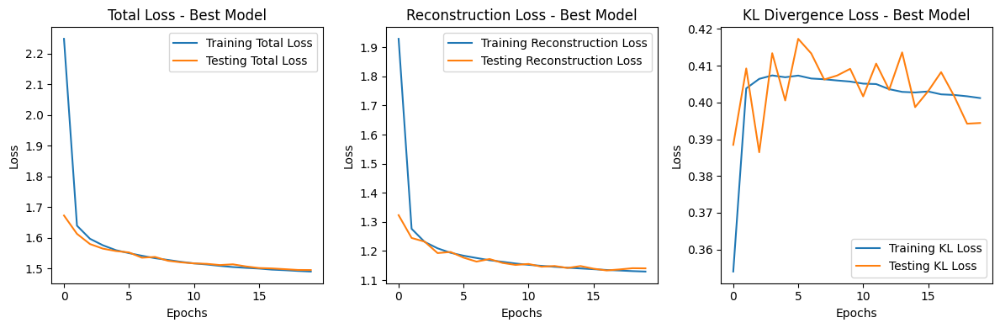

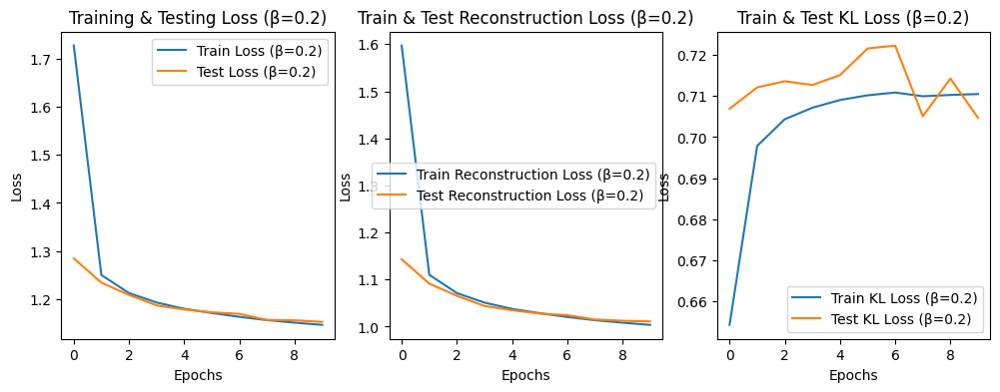

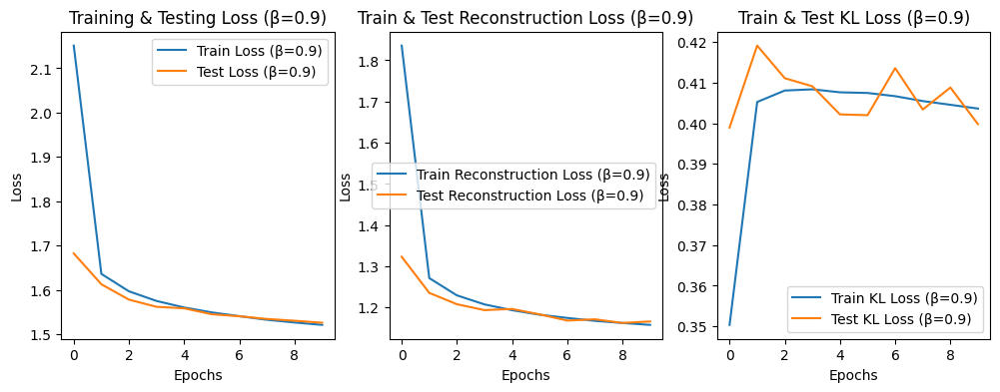

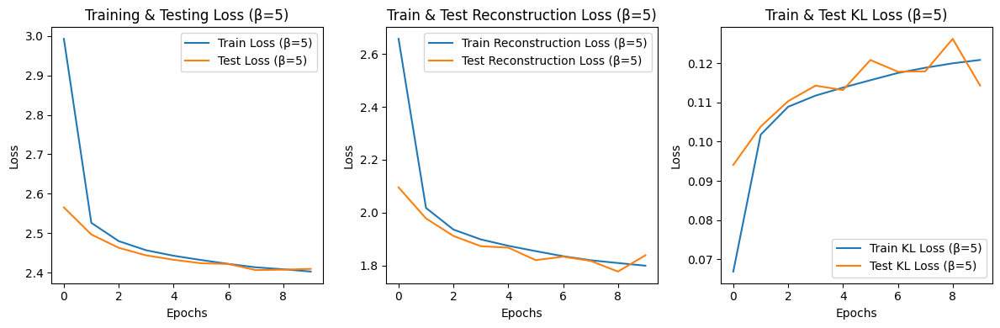

In [13]:
# Plot the training loss curves
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.plot(losses_best['train_losses'], label='Training Total Loss')
plt.plot(losses_best['test_losses'], label='Testing Total Loss')
plt.title('Total Loss - Best Model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(losses_best['train_reconstruction_losses'], label='Training Reconstruction Loss')
plt.plot(losses_best['test_reconstruction_losses'], label='Testing Reconstruction Loss')
plt.title('Reconstruction Loss - Best Model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(losses_best['train_klds'], label='Training KL Loss')
plt.plot(losses_best['test_klds'], label='Testing KL Loss')
plt.title('KL Divergence Loss - Best Model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()



for idx, (beta, losses) in enumerate(beta_losses.items(), start=1):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.plot(losses['train_losses'], label=f'Train Loss (β={beta})')
    plt.plot(losses['test_losses'], label=f'Test Loss (β={beta})')
    plt.title(f'Training & Testing Loss (β={beta})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(losses['train_reconstruction_losses'], label=f'Train Reconstruction Loss (β={beta})')
    plt.plot(losses['test_reconstruction_losses'], label=f'Test Reconstruction Loss (β={beta})')
    plt.title(f'Train & Test Reconstruction Loss (β={beta})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(losses['train_klds'], label=f'Train KL Loss (β={beta})')
    plt.plot(losses['test_klds'], label=f'Test KL Loss (β={beta})')
    plt.title(f'Train & Test KL Loss (β={beta})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

plt.tight_layout()
plt.show()



## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

For reference, here's [some samples from our VAE](https://imgur.com/NwNMuG3).


Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


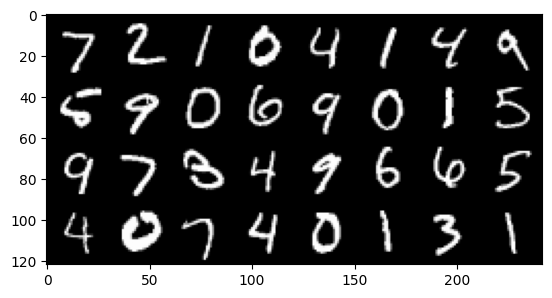

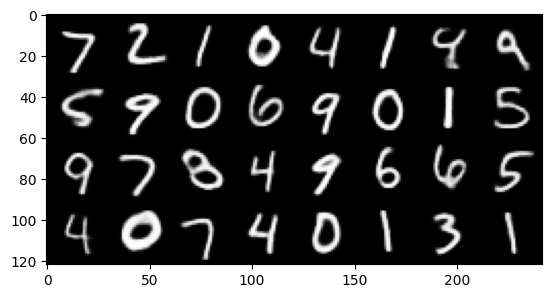

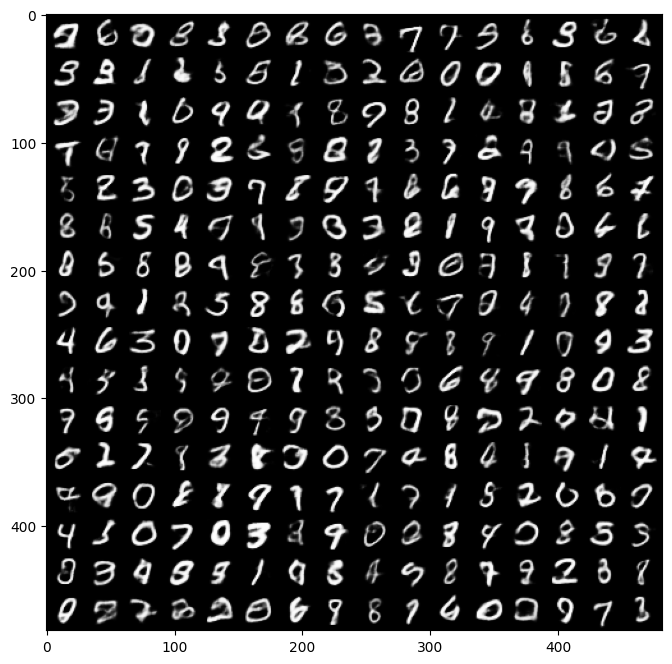

In [14]:
# *CODE FOR PART 1.2b IN THIS CELL*


# load the model
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set

    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    # recon_batch =
    model.eval()
    recon_batch, _, _ = model.forward(fixed_input.to(device))
    # recon_batch = recon_batch.view(-1, 1, 28, 28)
    #######################################################################
    #                       ** END OF YOUR CODE **
    #######################################################################

    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            value_range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')
print('-'*50)
model.eval()
n_samples = 256
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.decode(z)
    #######################################################################
    #                       ** END OF YOUR CODE **
    #######################################################################

    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            value_range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)



### Discussion
Provide a brief analysis of your loss curves and reconstructions:
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable?
* What is posterior collapse and did you observe it during training (i.e. when the KL is too small during the early stages of training)?
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**YOUR ANSWER**

**Observation & Explain**

$$Loss\mathcal=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

According to the loss definition above, to achieve minimal loss, the equation must either decrease the first term or increase the second term (considering there is a minus sign before it). Thus, we expect the total loss and reconstruction loss (log-likelihood loss) to decrease over time, while the KL loss should instead increase. As observed from the graph, these three losses perform exactly the trend we desired. Even though the KL loss during testing does not seem to reach a plateau within 20 epochs, it still shows an upward trend since epoch 1, indicating it is moving towards convergence.

**Posterior Collapse Explained**

Posterior collapse is a phenomenon where the model's encoder ignores the latent variables during training, mapping all input to similar points in the latent space. This leads to poor diversity in generated samples and poor reconstruction quality. Posterior collapse was observed in the early training stages when the KL Loss term was too small, resulting in outputs that were random, pixel-filled images. This means the difference between the learned latent variable distribution and the prior distribution became too close.

To mitigate this, I used beta to balance the reconstruction loss and KL loss, aiming to achieve a balance between generating high-quality samples and maintaining reconstruction quality. A beta value of 0.9 provided effective performance in mitigating posterior collapse. When beta is set too high, such as 5, the KL loss dominates the loss, and reconstruction contributes too little, leading to poor reconstruction results.

---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). You can use a T-SNE implementation from a library such as scikit-learn.

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [15]:
from sklearn.manifold import TSNE

latent_feature_vectors = []
labels_vectors = []

model.eval()
with torch.no_grad():
    for imgs, labels in loader_test:
        imgs = imgs.to(device)
        mu, logvar = model.encode(imgs)
        latent_feature_vectors.append(mu.cpu().numpy())
        labels_vectors.append(labels.numpy())

latent_feature_vectors = np.concatenate(latent_feature_vectors, axis=0)
labels_vectors = np.concatenate(labels_vectors, axis=0)

tsne = TSNE(n_components=2, random_state=1000, verbose = 0, perplexity = 40, n_iter = 400, init='pca')
z_embedded = tsne.fit_transform(latent_feature_vectors)

In [16]:
# Interactive Visualization - Code Provided
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - Embedded X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)


alt.HConcatChart(...)

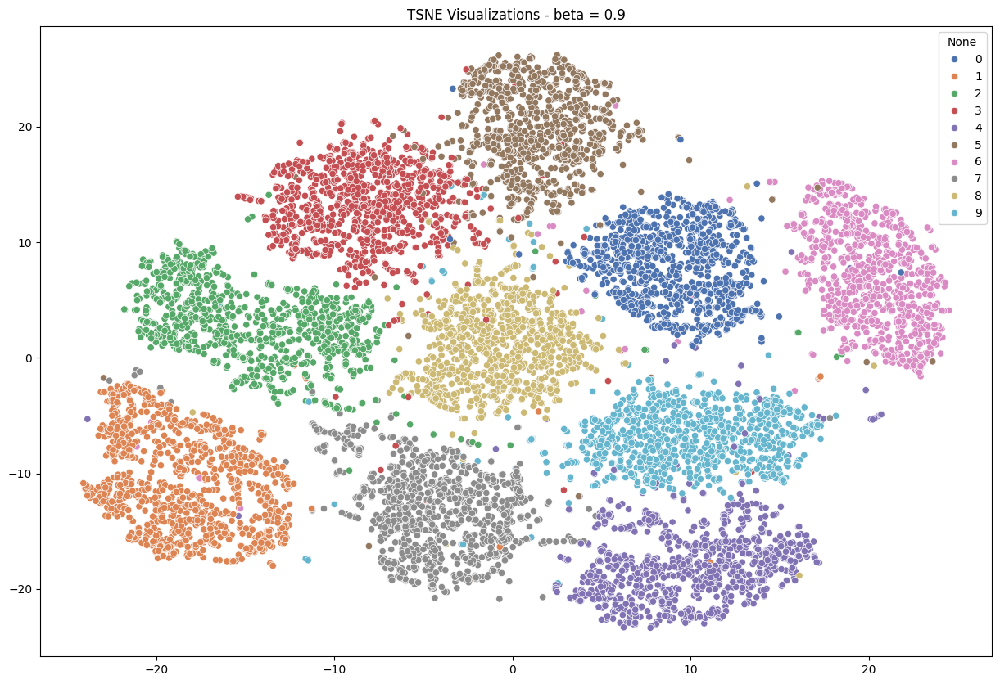

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming z_embedded and loader_test.dataset.targets are already defined

# Plot
plt.figure(figsize=(15,10))
sns.scatterplot(
    x=z_embedded[:, 0], y=z_embedded[:, 1],
    hue=loader_test.dataset.targets,
    palette=sns.color_palette("deep", 10),
    legend="full"
)

plt.title("TSNE Visualizations - beta = 0.9")

plt.show()


###Beta = 0.2

<figure>
  <img src="https://drive.google.com/uc?export=view&id=1GMm1OiWOQid5oqxkHT_S_cQUloVNaukt" style="width:60%">
</figure>



###Beta = 5.0


<figure>
  <img src="https://drive.google.com/uc?export=view&id=1-cpgRf2w3fKvd4WhRv9_fLzWmyAm6qxn" style="width:60%">
</figure>



### Discussion
What do you observe? Discuss the structure of the visualized representations.
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

Note - If you created multiple plots and want to include them in your discussion, the best option is to upload them to (e.g.) google drive and then embed them via a **public** share link. If you reference local files, please include these in your submission zip, and use relative pathing if you are embedding them (with the notebook in the base directory)

**YOUR ANSWER**

**Structure**

The T-SNE visualization represents a 20-dimensional latent space in 2D space, which demonstrates the distribution of different digits. In the graph, each cluster represents a group of the same digits, and the similar digits (such as 3 and 5) are located in their clusters that are pretty close to each other.

**KL Loss & Beta**

In the provided T-SNE visualization, I have used β values of 0.2, 0.9, and 5.0. The β parameter regulates the importance of the KL loss term in the loss function. The KL loss describes how close the latent variable distribution is to the prior distribution. With a smaller β, the model prioritizes reconstruction, and vice versa.

**Outlier & Boundary & Cluster**

As seen in the graph, when β increases, outliers become less and more unobvious, because classes begin to overlap, resulting in more indistinct boundaries.For instance, 3 and 5 are closer and closer.

The boundaries between clusters, especially at β=0.9 and β=5.0, are less sharp than at β=0.2, indicating a smoother gradient of features in the latent space but also decreased class distinguishability.

As β increases, the clusters has more irregular shapes and are less distinct to each other, resulting in the increased overlap between clusters. At β=5.0, clusters diffuse and significantly overlap (3 with 5, and 9 with 7), which indicates that the KL loss dominates the loss function and the risk of having posterior collapse. At β=0.2, clusters are distinct and effectively classify classes, although the focus on reconstruction loss may cause overfitting. β=0.9 maintains a less sharp but still distinct separation, with signs of merging between clusters like 3 and 5. This means increased regularization in the latent space, which may help toprevent overfitting without compromising too much on latent space's flexibility.

**T-SNE Reliability**

I believe T-SNE is reliable. When the perplexity changes, the shape of the cluster changes, but it doesn't affect the relative positions between them. Therefore, it doesn't affect the interpretation of the data structure.

However, the number of iterations does change the visual representation of the latent space, and the representation can be completely different.

Overall, T-SNE remains sensitive to its hyperparameters, so it's better to interpret the visualization in conjunction with other types of analysis.


## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?

_hint: Locate the positions in latent space of 2 data points (maybe a one and an eight). Then sample multiple latent space vectors along the line which joins the 2 points and pass them through the decoder._


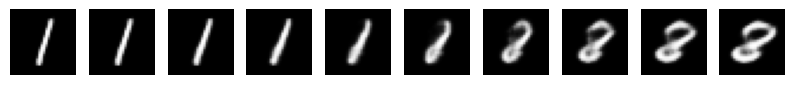

In [18]:
# fetches the next batch of images and labels
imgs, labels = next(iter(loader_test))
img1 = imgs[labels == 1][0].unsqueeze(0).to(device)  # first '1' in the batch
img2 = imgs[labels == 8][0].unsqueeze(0).to(device)  # first '8' in the batch

# Encode to get the latent variables
with torch.no_grad():
    #encode the first one te get the mean and logvar in latent space
    mu1, logvar1 = model.encode(img1)
    mu2, logvar2 = model.encode(img2)
    #latent var
    latent_var_1 = model.reparametrize(mu1, logvar1)
    latent_var_2 = model.reparametrize(mu2, logvar2)

    latents_interpo = []
    #interpolates 11 latent variables between 1 and 2
    # by linearly mixing them with alpha [0-1]
    for i in range(11):
        alpha = i / 10
        z = latent_var_1 * (1 - alpha) + latent_var_2 * alpha  # interpolated
        latents_interpo.append(z)

    # decode back to images
    imgs_interpo = []
    for z in latents_interpo:
        img = model.decode(z).to(device)
        imgs_interpo.append(img)


fig, axs = plt.subplots(1, 10, figsize=(10, 1))
for i, ax in enumerate(axs):
    ax.imshow(imgs_interpo[i].detach().cpu().numpy().reshape(28, 28), cmap='gray')
    ax.axis('off')
plt.show()


### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

**YOUR ANSWER**

From left to right, the digits 1 and 8 start to look more similar around the center (from image 5 to 6). This indicates smooth interpolation in the latent space from 1 to 8. The gradual change from one digit evolving into the other is desired as we move between different spaces.

This process can be related to the given T-SNE visualization. The transition from 1 (orange, upper left) to 8 (brown, center) has other digits like 2 and 7 (red and pink) between their clusters on the T-SNE plot, but the interpolation does not show these 'obstacle' digits. This means their actual distance is closer than it appears.



# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures and tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with:

- your best trained model (which we will be able to load and run),
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse),
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case.
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse.

## Part 2.1 (30 points)
**Your Task**:

a. Implement the DCGAN architecture.

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [19]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x, channels=None, w=None ,h=None, resize = False):

    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_GAN'):
    os.makedirs(content_path/'CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions.
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`).
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small kernels, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [20]:
batch_size = 128  # change that

transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=mean, std=std),
])
# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

100%|██████████| 170498071/170498071 [00:14<00:00, 11937334.29it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data/
Files already downloaded and verified


We'll visualize a subset of the test set:

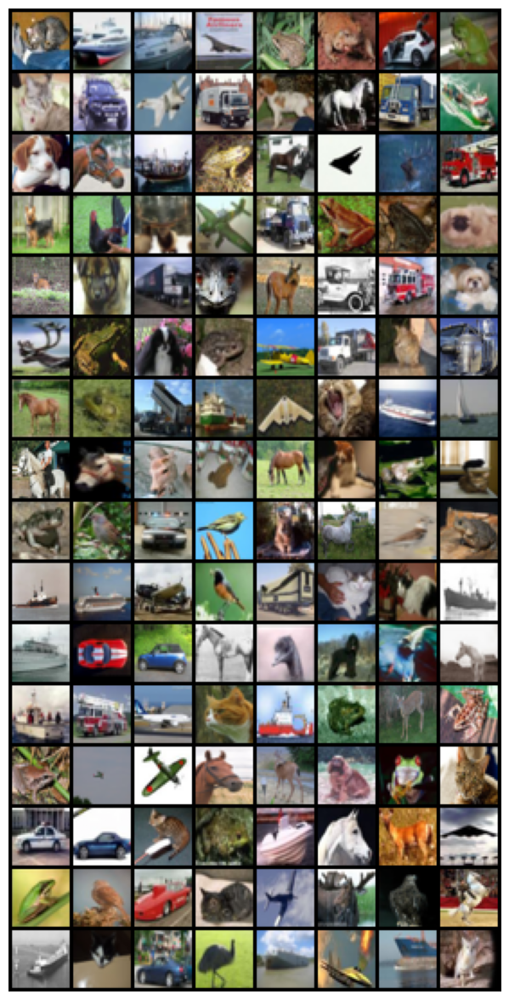

In [21]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [22]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 72
learning_rate = 0.0002
latent_vector_size = 100

# Other hyperparams


In [23]:
# *CODE FOR PART 2.1 IN THIS CELL*
img_channels_out = 3 # the images to be generated or discriminated against will have 3 color - rgb
gd_img_size = 32
kernel_size = 4

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.gen_archi = nn.Sequential(
            #Uupsample the input feature
            nn.ConvTranspose2d(latent_vector_size, gd_img_size * 16, kernel_size, 1, 0, bias=False),
            nn.BatchNorm2d(gd_img_size * 16),
            nn.ReLU(True),

            nn.ConvTranspose2d(gd_img_size * 16, gd_img_size * 8, kernel_size, 2, 1, bias=False),
            nn.BatchNorm2d(gd_img_size * 8),
            nn.ReLU(True),

            nn.ConvTranspose2d(gd_img_size * 8, gd_img_size * 4, kernel_size, 2, 1, bias=False),
            nn.BatchNorm2d(gd_img_size * 4),
            nn.ReLU(True),

            # nn.ConvTranspose2d(gd_img_size * 4, gd_img_size * 2, kernel_size, 2, 1, bias=False),
            # nn.BatchNorm2d(gd_img_size * 2),
            # nn.ReLU(True),

            nn.ConvTranspose2d(gd_img_size * 4 , img_channels_out, kernel_size , 2, 1, bias=False),
            nn.Tanh()
        )
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    # You can modify the arguments of this function if needed
    def forward(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.gen_archi(z)
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        return out


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.discri_archi = nn.Sequential(
            nn.Conv2d( img_channels_out, gd_img_size * 4, kernel_size, 2, 1, bias=False),
            #nn.BatchNorm2d(gd_img_size * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Dropout(p=0.05),

            nn.Conv2d(gd_img_size * 4 , gd_img_size * 8, kernel_size, 2, 1, bias=False),
            nn.BatchNorm2d(gd_img_size * 8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Dropout(p=0.2),

            nn.Conv2d(gd_img_size * 8, gd_img_size * 16, kernel_size, 2, 1, bias=False),
            nn.BatchNorm2d(gd_img_size * 16),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Dropout(p=0.2),

            nn.Conv2d(gd_img_size * 16, gd_img_size * 32, kernel_size, 2, 1, bias=False),
            nn.BatchNorm2d(gd_img_size * 32),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Dropout(p=0.2),

            nn.Conv2d(gd_img_size * 32, 1, 2, 1, 0, bias=False),
            nn.Sigmoid()
        )

        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

    # You can modify the arguments of this function if needed
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.discri_archi(x)
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################

        return out


<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [24]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [25]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 3448576
Generator(
  (gen_archi): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Total number of parameters in Discriminator is: 11023872
Discriminator(
  (discri_archi): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [26]:
# You can modify the arguments of this function if needed
criterion = nn.BCELoss(reduction='mean')
def loss_function(out, label):
    loss = criterion(out, label)
    return loss


<h3>Choose and initialize optimizers</h3>

In [27]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
beta1 = 0.5
optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))

sche_G = torch.optim.lr_scheduler.StepLR(optimizerG, step_size=10, gamma=0.9)
sche_D = torch.optim.lr_scheduler.StepLR(optimizerD, step_size=10, gamma=0.9)

<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [28]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
# Additional input variables should be defined here
real_label = 0.9
fake_label = 0.1

#### Training Loop

Complete the training loop below. We've defined some variables to keep track of things during training:
* errD: Loss of Discriminator after being trained on real and fake instances
* errG: Loss of Generator
* D_x: Output of Discriminator for real images
* D_G_z1: Output of Discriminator for fake images (When Generator is not being trained)
* D_G_z2: Output of Discriminator for fake images (When Generator is being trained)

In [29]:
train_losses_G = []
train_losses_D = []

# <- You may wish to add logging info here
for epoch in range(num_epochs):
    # <- You may wish to add logging info here
    with tqdm.tqdm(loader_train, unit="batch") as tepoch:
        train_loss_D = 0
        train_loss_G = 0
        for i, data in enumerate(tepoch):

            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))

            model_D.zero_grad()
            real_cpu = data[0].to(device)
            batch_size = real_cpu.size(0)
            # train with real
            label_both = torch.full((batch_size,), real_label, dtype=torch.float, device=device)
            #forward pass
            output = model_D(real_cpu).view(-1)
            #loss calculation
            errD_real = loss_function(output, label_both)
            #gradient
            errD_real.backward()
            #Output of Discriminator for real images
            D_x = output.mean().item()




            # train with fake
            #generate batch
            noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)

            #fake image generation
            fake_img = model_G(noise)
            label_both.fill_(fake_label)
            #classify batch
            output = model_D(fake_img.detach()).view(-1)
            #loss calculation
            errD_fake = loss_function(output, label_both)
            #gradient calculation - sum
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            #error in total
            errD = errD_real + errD_fake
            train_loss_D += errD.item()
            #update D param
            optimizerD.step()




            # (2) Update G network: maximize log(D(G(z)))
            model_G.zero_grad()
            label_both.fill_(real_label)
            #forward pass
            output = model_D(fake_img).view(-1)
            #loss calculation
            errG = loss_function(output, label_both)

            #gradient
            errG.backward()
            D_G_z2 = output.mean().item()
            train_loss_G += errG.item()
            #update g paran
            optimizerG.step()
            #######################################################################
            #                       ** END OF YOUR CODE **
            #######################################################################
            # Logging
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x,
                                  Loss_D=errD.item(), Loss_G=errG.item())
    sche_D.step()
    sche_G.step()

    if epoch == 0:
        save_image(denorm(real_cpu.cpu()).float(), content_path/'CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), str(content_path/'CW_GAN/fake_samples_epoch_%03d.png') % epoch)
    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))

    print(f'Epoch: {epoch}, D:{train_loss_D / len(loader_train)}, G: {train_loss_G / len(loader_train)}')

# save  models
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), content_path/'CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), content_path/'CW_GAN/GAN_D_model.pth')



Epoch 0: 100%|██████████| 391/391 [00:18<00:00, 21.08batch/s, D_G_z=0.222/0.056, D_x=0.815, Loss_D=0.784, Loss_G=2.81]


Epoch: 0, D:1.082057267198782, G: 3.227642708727161


Epoch 1: 100%|██████████| 391/391 [00:18<00:00, 21.40batch/s, D_G_z=0.271/0.074, D_x=0.781, Loss_D=0.853, Loss_G=2.5]


Epoch: 1, D:0.9353699501213211, G: 2.6131432533569043


Epoch 2: 100%|██████████| 391/391 [00:18<00:00, 21.02batch/s, D_G_z=0.176/0.194, D_x=0.509, Loss_D=1.11, Loss_G=1.6]


Epoch: 2, D:0.94535343451878, G: 2.524532549216619


Epoch 3: 100%|██████████| 391/391 [00:18<00:00, 21.14batch/s, D_G_z=0.261/0.098, D_x=0.781, Loss_D=0.837, Loss_G=2.25]


Epoch: 3, D:0.9886548590782048, G: 2.291444936066942


Epoch 4: 100%|██████████| 391/391 [00:18<00:00, 21.20batch/s, D_G_z=0.202/0.077, D_x=0.795, Loss_D=0.774, Loss_G=2.48]


Epoch: 4, D:0.9708833596895418, G: 2.270446499595252


Epoch 5: 100%|██████████| 391/391 [00:18<00:00, 21.00batch/s, D_G_z=0.304/0.185, D_x=0.616, Loss_D=1.05, Loss_G=1.66]


Epoch: 5, D:0.9880917980847761, G: 2.1638276701997916


Epoch 6: 100%|██████████| 391/391 [00:18<00:00, 21.40batch/s, D_G_z=0.596/0.058, D_x=0.788, Loss_D=1.35, Loss_G=2.77]


Epoch: 6, D:1.0472133979772973, G: 1.9788320364854526


Epoch 7: 100%|██████████| 391/391 [00:18<00:00, 21.37batch/s, D_G_z=0.216/0.211, D_x=0.698, Loss_D=0.88, Loss_G=1.52]


Epoch: 7, D:1.0498670438671356, G: 1.9276427941401597


Epoch 8: 100%|██████████| 391/391 [00:18<00:00, 21.14batch/s, D_G_z=0.157/0.235, D_x=0.591, Loss_D=0.987, Loss_G=1.44]


Epoch: 8, D:1.0509045035637858, G: 1.874877005815506


Epoch 9: 100%|██████████| 391/391 [00:18<00:00, 20.98batch/s, D_G_z=0.245/0.196, D_x=0.639, Loss_D=0.955, Loss_G=1.63]


Epoch: 9, D:1.006246543906229, G: 1.8355148108414068


Epoch 10: 100%|██████████| 391/391 [00:18<00:00, 21.22batch/s, D_G_z=0.468/0.053, D_x=0.848, Loss_D=1.04, Loss_G=2.83]


Epoch: 10, D:0.9829758207511414, G: 1.9048290344150476


Epoch 11: 100%|██████████| 391/391 [00:18<00:00, 21.12batch/s, D_G_z=0.096/0.506, D_x=0.522, Loss_D=1.06, Loss_G=0.743]


Epoch: 11, D:0.992417531550083, G: 1.9636199888213517


Epoch 12: 100%|██████████| 391/391 [00:18<00:00, 21.12batch/s, D_G_z=0.222/0.308, D_x=0.502, Loss_D=1.17, Loss_G=1.2]


Epoch: 12, D:0.9571316406854888, G: 1.930759440602549


Epoch 13: 100%|██████████| 391/391 [00:18<00:00, 21.09batch/s, D_G_z=0.241/0.172, D_x=0.746, Loss_D=0.844, Loss_G=1.73]


Epoch: 13, D:0.9706581823356316, G: 1.9216681363637491


Epoch 14: 100%|██████████| 391/391 [00:18<00:00, 21.01batch/s, D_G_z=0.285/0.095, D_x=0.799, Loss_D=0.842, Loss_G=2.29]


Epoch: 14, D:0.9817747194748705, G: 1.8913061676732719


Epoch 15: 100%|██████████| 391/391 [00:18<00:00, 20.89batch/s, D_G_z=0.314/0.193, D_x=0.798, Loss_D=0.875, Loss_G=1.61]


Epoch: 15, D:0.9914868416078865, G: 1.8637648067815835


Epoch 16: 100%|██████████| 391/391 [00:18<00:00, 21.06batch/s, D_G_z=0.831/0.008, D_x=0.97, Loss_D=2.17, Loss_G=4.54]


Epoch: 16, D:0.9834983798548999, G: 1.8749558693155304


Epoch 17: 100%|██████████| 391/391 [00:18<00:00, 21.16batch/s, D_G_z=0.037/0.353, D_x=0.398, Loss_D=1.36, Loss_G=1.09]


Epoch: 17, D:0.9712204747187817, G: 1.8950889144102325


Epoch 18: 100%|██████████| 391/391 [00:18<00:00, 21.11batch/s, D_G_z=0.208/0.320, D_x=0.568, Loss_D=1.05, Loss_G=1.17]


Epoch: 18, D:0.9705292594707225, G: 1.8644677051497847


Epoch 19: 100%|██████████| 391/391 [00:18<00:00, 21.48batch/s, D_G_z=0.171/0.336, D_x=0.554, Loss_D=1.03, Loss_G=1.13]


Epoch: 19, D:0.9777081040165309, G: 1.8960786867324653


Epoch 20: 100%|██████████| 391/391 [00:18<00:00, 21.20batch/s, D_G_z=0.249/0.180, D_x=0.769, Loss_D=0.836, Loss_G=1.72]


Epoch: 20, D:0.9202856765988537, G: 1.8784111960769614


Epoch 21: 100%|██████████| 391/391 [00:18<00:00, 21.20batch/s, D_G_z=0.332/0.157, D_x=0.735, Loss_D=0.952, Loss_G=1.85]


Epoch: 21, D:0.9293528813535296, G: 1.9600683039106677


Epoch 22: 100%|██████████| 391/391 [00:18<00:00, 21.45batch/s, D_G_z=0.222/0.301, D_x=0.503, Loss_D=1.14, Loss_G=1.21]


Epoch: 22, D:0.9372296040625219, G: 1.9315492439148065


Epoch 23: 100%|██████████| 391/391 [00:18<00:00, 21.53batch/s, D_G_z=0.094/0.339, D_x=0.645, Loss_D=0.896, Loss_G=1.11]


Epoch: 23, D:0.9330001625868366, G: 1.93119013431432


Epoch 24: 100%|██████████| 391/391 [00:18<00:00, 21.13batch/s, D_G_z=0.231/0.094, D_x=0.901, Loss_D=0.764, Loss_G=2.33]


Epoch: 24, D:0.937235069244414, G: 1.954542147152869


Epoch 25: 100%|██████████| 391/391 [00:18<00:00, 21.12batch/s, D_G_z=0.141/0.229, D_x=0.721, Loss_D=0.808, Loss_G=1.49]


Epoch: 25, D:0.9230950706450226, G: 1.952814685185547


Epoch 26: 100%|██████████| 391/391 [00:18<00:00, 21.24batch/s, D_G_z=0.291/0.165, D_x=0.843, Loss_D=0.825, Loss_G=1.79]


Epoch: 26, D:0.9154715496865685, G: 1.9633208254109258


Epoch 27: 100%|██████████| 391/391 [00:18<00:00, 21.45batch/s, D_G_z=0.266/0.124, D_x=0.82, Loss_D=0.808, Loss_G=2.06]


Epoch: 27, D:0.9172267397041516, G: 1.9566835541554424


Epoch 28: 100%|██████████| 391/391 [00:18<00:00, 21.49batch/s, D_G_z=0.101/0.424, D_x=0.579, Loss_D=0.982, Loss_G=0.893]


Epoch: 28, D:0.9179919496216737, G: 1.9729723232176604


Epoch 29: 100%|██████████| 391/391 [00:18<00:00, 21.20batch/s, D_G_z=0.405/0.111, D_x=0.861, Loss_D=0.95, Loss_G=2.16]


Epoch: 29, D:0.9019222924166628, G: 2.022360729591926


Epoch 30: 100%|██████████| 391/391 [00:18<00:00, 21.44batch/s, D_G_z=0.199/0.224, D_x=0.766, Loss_D=0.824, Loss_G=1.49]


Epoch: 30, D:0.8606729449518501, G: 2.0322043606844704


Epoch 31: 100%|██████████| 391/391 [00:18<00:00, 21.48batch/s, D_G_z=0.242/0.200, D_x=0.52, Loss_D=1.17, Loss_G=1.57]


Epoch: 31, D:0.9047087626079159, G: 2.0189501588301892


Epoch 32: 100%|██████████| 391/391 [00:18<00:00, 21.36batch/s, D_G_z=0.259/0.074, D_x=0.79, Loss_D=0.825, Loss_G=2.53]


Epoch: 32, D:0.8484942446584287, G: 1.9990597457227195


Epoch 33: 100%|██████████| 391/391 [00:18<00:00, 21.50batch/s, D_G_z=0.186/0.150, D_x=0.737, Loss_D=0.822, Loss_G=1.86]


Epoch: 33, D:0.9127795639855173, G: 2.008997783407836


Epoch 34: 100%|██████████| 391/391 [00:18<00:00, 21.40batch/s, D_G_z=0.095/0.285, D_x=0.622, Loss_D=0.917, Loss_G=1.27]


Epoch: 34, D:0.8539472507393878, G: 2.0390027962682193


Epoch 35: 100%|██████████| 391/391 [00:18<00:00, 21.52batch/s, D_G_z=0.158/0.149, D_x=0.712, Loss_D=0.826, Loss_G=1.89]


Epoch: 35, D:0.9068336105712539, G: 2.015772984613238


Epoch 36: 100%|██████████| 391/391 [00:18<00:00, 21.40batch/s, D_G_z=0.137/0.241, D_x=0.665, Loss_D=0.87, Loss_G=1.41]


Epoch: 36, D:0.8493687984583628, G: 2.0786021632306717


Epoch 37: 100%|██████████| 391/391 [00:18<00:00, 21.57batch/s, D_G_z=0.226/0.151, D_x=0.859, Loss_D=0.765, Loss_G=1.87]


Epoch: 37, D:0.8696711714310414, G: 2.0571749806404114


Epoch 38: 100%|██████████| 391/391 [00:18<00:00, 21.38batch/s, D_G_z=0.072/0.266, D_x=0.619, Loss_D=0.93, Loss_G=1.34]


Epoch: 38, D:0.8430470069655982, G: 2.1067457023788903


Epoch 39: 100%|██████████| 391/391 [00:18<00:00, 21.51batch/s, D_G_z=0.294/0.126, D_x=0.906, Loss_D=0.811, Loss_G=2.05]


Epoch: 39, D:0.8615092488810839, G: 2.10328538582453


Epoch 40: 100%|██████████| 391/391 [00:18<00:00, 21.32batch/s, D_G_z=0.144/0.155, D_x=0.864, Loss_D=0.711, Loss_G=1.86]


Epoch: 40, D:0.8240112255296439, G: 2.0728723969300993


Epoch 41: 100%|██████████| 391/391 [00:18<00:00, 21.32batch/s, D_G_z=0.181/0.157, D_x=0.783, Loss_D=0.772, Loss_G=1.81]


Epoch: 41, D:0.8411982245457447, G: 2.0629055715735305


Epoch 42: 100%|██████████| 391/391 [00:18<00:00, 21.55batch/s, D_G_z=0.201/0.084, D_x=0.864, Loss_D=0.743, Loss_G=2.44]


Epoch: 42, D:0.8268513002663928, G: 2.099932726386868


Epoch 43: 100%|██████████| 391/391 [00:18<00:00, 21.53batch/s, D_G_z=0.192/0.160, D_x=0.829, Loss_D=0.757, Loss_G=1.84]


Epoch: 43, D:0.8335123302991433, G: 2.127254491876763


Epoch 44: 100%|██████████| 391/391 [00:18<00:00, 21.56batch/s, D_G_z=0.238/0.180, D_x=0.837, Loss_D=0.778, Loss_G=1.69]


Epoch: 44, D:0.8371037319493111, G: 2.113293473372984


Epoch 45: 100%|██████████| 391/391 [00:18<00:00, 21.46batch/s, D_G_z=0.308/0.086, D_x=0.901, Loss_D=0.833, Loss_G=2.42]


Epoch: 45, D:0.8271674088504918, G: 2.135593949910015


Epoch 46: 100%|██████████| 391/391 [00:18<00:00, 21.46batch/s, D_G_z=0.041/0.281, D_x=0.574, Loss_D=1.02, Loss_G=1.3]


Epoch: 46, D:0.8402042462087959, G: 2.119297398020849


Epoch 47: 100%|██████████| 391/391 [00:18<00:00, 21.28batch/s, D_G_z=0.199/0.095, D_x=0.897, Loss_D=0.741, Loss_G=2.32]


Epoch: 47, D:0.8009689224650488, G: 2.162146165700215


Epoch 48: 100%|██████████| 391/391 [00:18<00:00, 21.60batch/s, D_G_z=0.120/0.174, D_x=0.776, Loss_D=0.753, Loss_G=1.73]


Epoch: 48, D:0.8197996088915773, G: 2.1539230563146683


Epoch 49: 100%|██████████| 391/391 [00:18<00:00, 21.44batch/s, D_G_z=0.165/0.137, D_x=0.808, Loss_D=0.747, Loss_G=1.94]


Epoch: 49, D:0.8275314067940578, G: 2.164824605597864


Epoch 50: 100%|██████████| 391/391 [00:18<00:00, 21.54batch/s, D_G_z=0.273/0.060, D_x=0.913, Loss_D=0.791, Loss_G=2.74]


Epoch: 50, D:0.8077292047498171, G: 2.1386001419533245


Epoch 51: 100%|██████████| 391/391 [00:18<00:00, 21.52batch/s, D_G_z=0.328/0.071, D_x=0.935, Loss_D=0.86, Loss_G=2.65]


Epoch: 51, D:0.7799618792960711, G: 2.176293119902501


Epoch 52: 100%|██████████| 391/391 [00:18<00:00, 21.38batch/s, D_G_z=0.244/0.164, D_x=0.903, Loss_D=0.767, Loss_G=1.81]


Epoch: 52, D:0.8463030820307524, G: 2.1171244211361535


Epoch 53: 100%|██████████| 391/391 [00:18<00:00, 21.49batch/s, D_G_z=0.222/0.205, D_x=0.77, Loss_D=0.813, Loss_G=1.59]


Epoch: 53, D:0.8044102074545058, G: 2.133728661424364


Epoch 54: 100%|██████████| 391/391 [00:18<00:00, 21.38batch/s, D_G_z=0.204/0.129, D_x=0.873, Loss_D=0.732, Loss_G=2]


Epoch: 54, D:0.7860088356010749, G: 2.1807022256314603


Epoch 55: 100%|██████████| 391/391 [00:18<00:00, 21.41batch/s, D_G_z=0.083/0.087, D_x=0.901, Loss_D=0.687, Loss_G=2.44]


Epoch: 55, D:0.7776664980232258, G: 2.1855069145827035


Epoch 56: 100%|██████████| 391/391 [00:18<00:00, 21.32batch/s, D_G_z=0.206/0.359, D_x=0.799, Loss_D=0.779, Loss_G=1.06]


Epoch: 56, D:0.8405675555738952, G: 2.1590297428695746


Epoch 57: 100%|██████████| 391/391 [00:18<00:00, 21.40batch/s, D_G_z=0.059/0.216, D_x=0.525, Loss_D=1.08, Loss_G=1.53]


Epoch: 57, D:0.7910748063146001, G: 2.134518882045356


Epoch 58: 100%|██████████| 391/391 [00:18<00:00, 21.39batch/s, D_G_z=0.128/0.131, D_x=0.868, Loss_D=0.698, Loss_G=1.98]


Epoch: 58, D:0.7928389710233644, G: 2.161242550901135


Epoch 59: 100%|██████████| 391/391 [00:18<00:00, 21.40batch/s, D_G_z=0.127/0.134, D_x=0.767, Loss_D=0.765, Loss_G=1.96]


Epoch: 59, D:0.7959547294375232, G: 2.185904430916242


Epoch 60: 100%|██████████| 391/391 [00:18<00:00, 20.96batch/s, D_G_z=0.155/0.324, D_x=0.749, Loss_D=0.787, Loss_G=1.13]


Epoch: 60, D:0.7594347224211144, G: 2.1605835040207104


Epoch 61: 100%|██████████| 391/391 [00:18<00:00, 20.79batch/s, D_G_z=0.075/0.194, D_x=0.826, Loss_D=0.72, Loss_G=1.63]


Epoch: 61, D:0.7781510392723181, G: 2.163014372139026


Epoch 62: 100%|██████████| 391/391 [00:18<00:00, 20.84batch/s, D_G_z=0.073/0.124, D_x=0.855, Loss_D=0.704, Loss_G=2.09]


Epoch: 62, D:0.7838498486582276, G: 2.1725749608195954


Epoch 63: 100%|██████████| 391/391 [00:18<00:00, 21.55batch/s, D_G_z=0.064/0.218, D_x=0.754, Loss_D=0.776, Loss_G=1.55]


Epoch: 63, D:0.7810236922920207, G: 2.15840238195551


Epoch 64: 100%|██████████| 391/391 [00:17<00:00, 21.81batch/s, D_G_z=0.086/0.170, D_x=0.837, Loss_D=0.712, Loss_G=1.73]


Epoch: 64, D:0.7703422727182393, G: 2.160772044945251


Epoch 65: 100%|██████████| 391/391 [00:17<00:00, 21.77batch/s, D_G_z=0.080/0.095, D_x=0.926, Loss_D=0.695, Loss_G=2.27]


Epoch: 65, D:0.7684274274674828, G: 2.177089871195576


Epoch 66: 100%|██████████| 391/391 [00:17<00:00, 21.76batch/s, D_G_z=0.131/0.105, D_x=0.925, Loss_D=0.695, Loss_G=2.19]


Epoch: 66, D:0.7806028490481169, G: 2.1703225230926746


Epoch 67: 100%|██████████| 391/391 [00:17<00:00, 21.78batch/s, D_G_z=0.222/0.074, D_x=0.892, Loss_D=0.755, Loss_G=2.53]


Epoch: 67, D:0.7686894135097103, G: 2.17869163519891


Epoch 68: 100%|██████████| 391/391 [00:17<00:00, 21.80batch/s, D_G_z=0.195/0.104, D_x=0.884, Loss_D=0.723, Loss_G=2.21]


Epoch: 68, D:0.7895038957181184, G: 2.192421278380372


Epoch 69: 100%|██████████| 391/391 [00:18<00:00, 21.65batch/s, D_G_z=0.088/0.247, D_x=0.602, Loss_D=0.938, Loss_G=1.39]


Epoch: 69, D:0.7764041754595764, G: 2.188965199243687


Epoch 70: 100%|██████████| 391/391 [00:17<00:00, 21.86batch/s, D_G_z=0.076/0.137, D_x=0.811, Loss_D=0.729, Loss_G=1.95]


Epoch: 70, D:0.7543324110148203, G: 2.175253412607686


Epoch 71: 100%|██████████| 391/391 [00:17<00:00, 21.81batch/s, D_G_z=0.104/0.175, D_x=0.814, Loss_D=0.724, Loss_G=1.7]


Epoch: 71, D:0.747465452574708, G: 2.1585195294731414


/usr/local/lib/python3.10/dist-packages/torch/jit/_trace.py:1093: TracerWarning: Output nr 1. of the traced function does not match the corresponding output of the Python function. Detailed error:
Tensor-likes are not close!

Mismatched elements: 128 / 128 (100.0%)
Greatest absolute difference: 0.5178038477897644 at index (56, 0, 0, 0) (up to 1e-05 allowed)
Greatest relative difference: 4.048088024585506 at index (90, 0, 0, 0) (up to 1e-05 allowed)
  _check_trace(


## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td>
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=18aWqRAnAVTRDY52y1yHSCdqSxUFRKOS9" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p>
</td>
<td>
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1ymO2-jGAvWeUR2kaj_LxQcGYF1RWNRnw" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p>
</td>
<td>
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=13SW62ekW32NMYtfcdm_dCJJ3ZMOZEZAJ" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p>
</td>
</tr></table>

### Generator samples

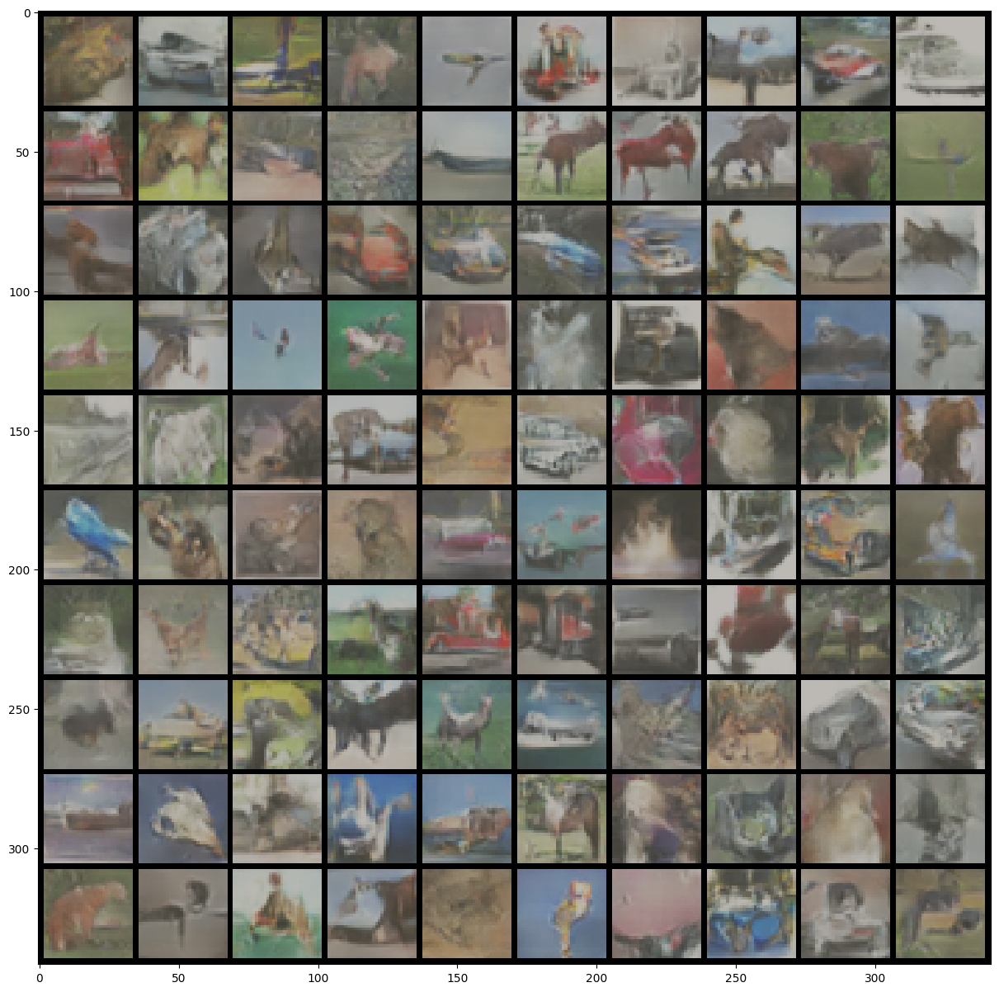

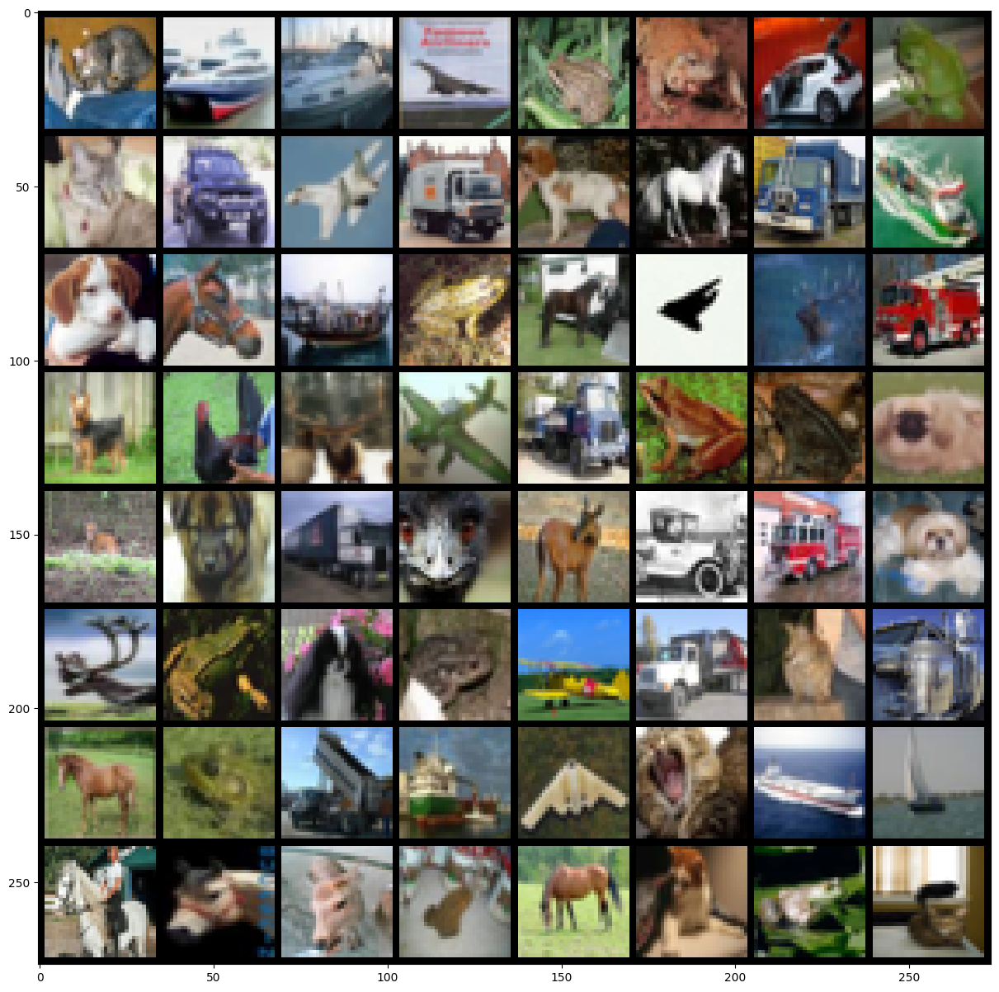

In [30]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated, content_path/'CW_GAN/Teaching_final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize

* What didn't work, what worked and what mattered most

* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

**Your Answer**

**Empirically methods**

- I set a learning rate of 0.0001 to promote gradual and stable learning.

- The number of epochs began at 20 and increased to 50 and more, allowing for sufficient training time to find 'optimal' model performance.

- Sigmoid and Tanh activations were used in the discriminator and generator, respectively, following literature recommendations.

- An adaptive learning rate using a scheduler was employed on generator and discriminator, which helped in reducing the traning time.

- Constructing the generator and discriminator with four convolutional layers each ensured a balance in model complexity, with 25M parameter constraint.

- The latent dimension was set to 100 and the output channels to three (RGB).

**What worked and didn't work:**

- Adjusting the learning rates for the generator to 0.002 and the discriminator to 0.001, aiming to address the generator's convergence dificulty, had unobvious impact.

- Different scheduler steps for the generator (20) and discriminator (10) did not prevent model collapse.

- Gamma values of 0.9 in the scheduler helped the model to train faster.

- Adding batch normalization to every layer effectively prevented model collapse as mentioned later. Removing batch normalization from the first layer of the discriminator led to collapse under the current architecture.

- Although dropout probabiliy (0.2, 0.1, 0.05) in the first layer had unobvious difference, the eventual combination of 0.05 and 0.2 dropout in every discriminator layer resulted in lower loss.

- Expanding the discriminator to five layers improved model's convergence performanc, reduced the loss, and prevented the g_loss from increasing too much after 10 epochs.

- Determined that 20 epochs were insufficient for acceptable output quality, settling on 72 epochs after trials with 20, 50, and 70.

**Tricks from literature**

- Batch Normalization: Employing batch normalization in both the generator and discriminator was crucial to prevent model collapse.

- Activation Functions: Using ReLU and Tanh in the generator and LeakyReLU and Sigmoid in the discriminator optimized performance.

- Learning Rate: The often recommended learning rate of 0.001 was too high, 0.0002 was chosen instead. The utilization of schedulers for adaptive rate adjustment shortens the training time.

- A mini-batch size of 128 was chosen for efficient memory usage and stable gradient estimation.

- Label smoothing by setting real labels to 0.9 and fake labels to 0.1 may help prevent overconfidence in the discriminator, promoting a more robust and generalized model.

## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

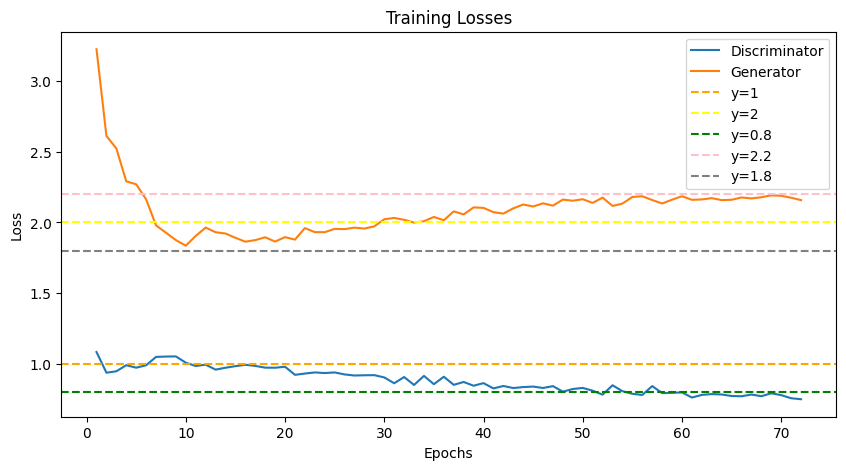

In [82]:
# ANSWER FOR PART 2.2 IN THIS CELL*

import matplotlib.pyplot as plt
epochs = range(1, len(train_losses_D) + 1)

plt.figure(figsize=(10,5))
plt.plot(epochs, train_losses_D, label='Discriminator')
plt.plot(epochs, train_losses_G, label='Generator')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Losses')

plt.axhline(y=1, color='orange', linestyle='--',label="y=1")
plt.axhline(y=2.0, color='yellow',linestyle='--',label="y=2")
plt.axhline(y=0.8, color='g', linestyle='--',label="y=0.8")
plt.axhline(y=2.2, color='pink', linestyle='--',label ="y=2.2")
plt.axhline(y=1.8, color='grey', linestyle='--',label ="y=1.8")

plt.legend()
plt.show()

### Discussion

Do your loss curves look sensible? What would you expect to see and why?

**YOUR ANSWER**

Yes, it looks sensible, even though the curve is not perfect.

Overall, the losses for both the discriminator and generator seem to stabilize over the epochs. The generator's loss decreases sharply in the early training stages, and then it stabilizes between 2 and 2.2. The discriminator's loss doesn't show a steep trend as generator in the beginning, but it also demonstrates an overall decreasing trend and stabilizes around 0.8 in the end.

The stability and convergence over time as shown in the graph are exactly what we expect, especially this trend could be observed within 20 epochs. This means that the generator is improving to occasionally fool the discriminator, and the distriminator is also getting better to distingihsing real data from fake data.

However, the higher generator loss and lower discriminator loss may indicate that the discriminatos is becoming "stronger" than generator. The adversal process, when generator's loss increases then the discriminator's loss decreases, might lead to model collapse if they cannot be balanced, which will be discussed in 2.3. This suggests that further adjustments to the architecture are desirable if possible, yet I don't have time for that.

## Part 2.3: Understanding Mode Collapse (5 points)
**Your task:**

Describe the what causes the phenomenon of Mode Collapse and how it may manifest in the samples from a GAN.

Based on the images created by your generator using the `fixed_noise` vector during training, did you notice any mode collapse? what this behaviour may be attributed to, and what did you try to eliminate / reduce it?

In [32]:
# Any additional code

### Discussion


**YOUR ANSWER**

Mode collapse is a phenomenon where the generator produces a limited variety of outputs, ignoring the rich variety of inputs. Mode collapse may manifest in the samples from a GAN as a lack of diversity of the generated image.

If the same or similar patterns appear repeatedly, especially when using a fixed noise vector, it indicates mode collapse. I noticed this during training, with many "block" containing "red" and "green" pixels.

Mode collapse may be caused by an imbalance, where the discriminator doesn't provide enough gradient information for the generator to learn the entire data distribution. As mentioned in 2.2, the generator and discriminator are in an adversarial process, and ideally, they should converge to certain values. However, if the generator becomes too good at creating images that the discriminator can't distinguish from real ones, it may start to produce only those certain types of images.

To mitigate mode collapse, I tuned some parameters. The BatchNorm() added after each layer significantly reduced the Model Collapse. I also explored various architectures to prevent mode collapse as mentioned in 2.1d.



# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably.

<font color="orange"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [33]:
# If you want to run these tests yourself, change directory:
# %cd '.../dl_cw2/'
ta_data_path = "../data" # You can change this to = data_path when testing

In [34]:
!pip install -q torch torchvision

In [35]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [36]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def gan_denorm(x, channels=None, w=None ,h=None, resize = False):

    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

gan_latent_size =100

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [37]:
# Load VAE Dataset
test_dat = datasets.MNIST(ta_data_path, train=False, transform=vae_transform,
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

100%|██████████| 9912422/9912422 [00:00<00:00, 348690065.29it/s]

Extracting ../data/MNIST/raw/train-images-idx3-ubyte.gz to ../data/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 38664441.05it/s]


Extracting ../data/MNIST/raw/train-labels-idx1-ubyte.gz to ../data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 139717800.29it/s]

Extracting ../data/MNIST/raw/t10k-images-idx3-ubyte.gz to ../data/MNIST/raw




100%|██████████| 4542/4542 [00:00<00:00, 6497451.83it/s]

Extracting ../data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ../data/MNIST/raw



In [38]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

Used CNN


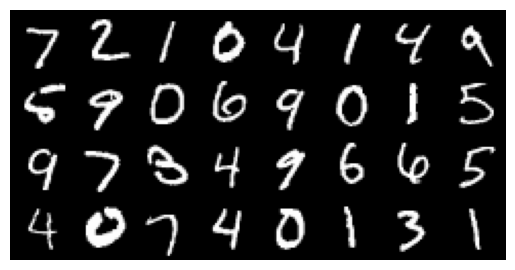

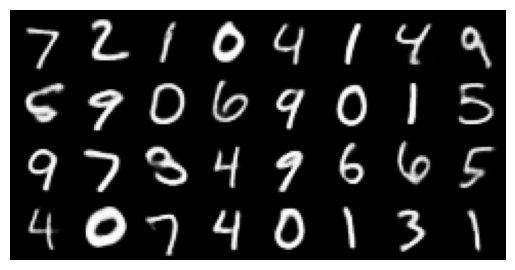

In [39]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
#vae = model_G = torch.jit.load('./CW_VAE/VAE_model.pth')
vae = model_G = torch.jit.load(content_path/'CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional
def recurse_cnn_check(parent, flag):
    if flag:
        return flag
    children = list(parent.children())
    if len(children) > 0:
        for child in children:
            flag = flag or recurse_cnn_check(child, flag)
    else:
        params = parent._parameters
        if 'weight' in params.keys():
            flag = params['weight'].ndim == 4
    return flag

has_cnn = recurse_cnn_check(vae, False)
print("Used CNN" if has_cnn else "Didn't Use CNN")

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

Number of Parameters is 14472448 which is ok


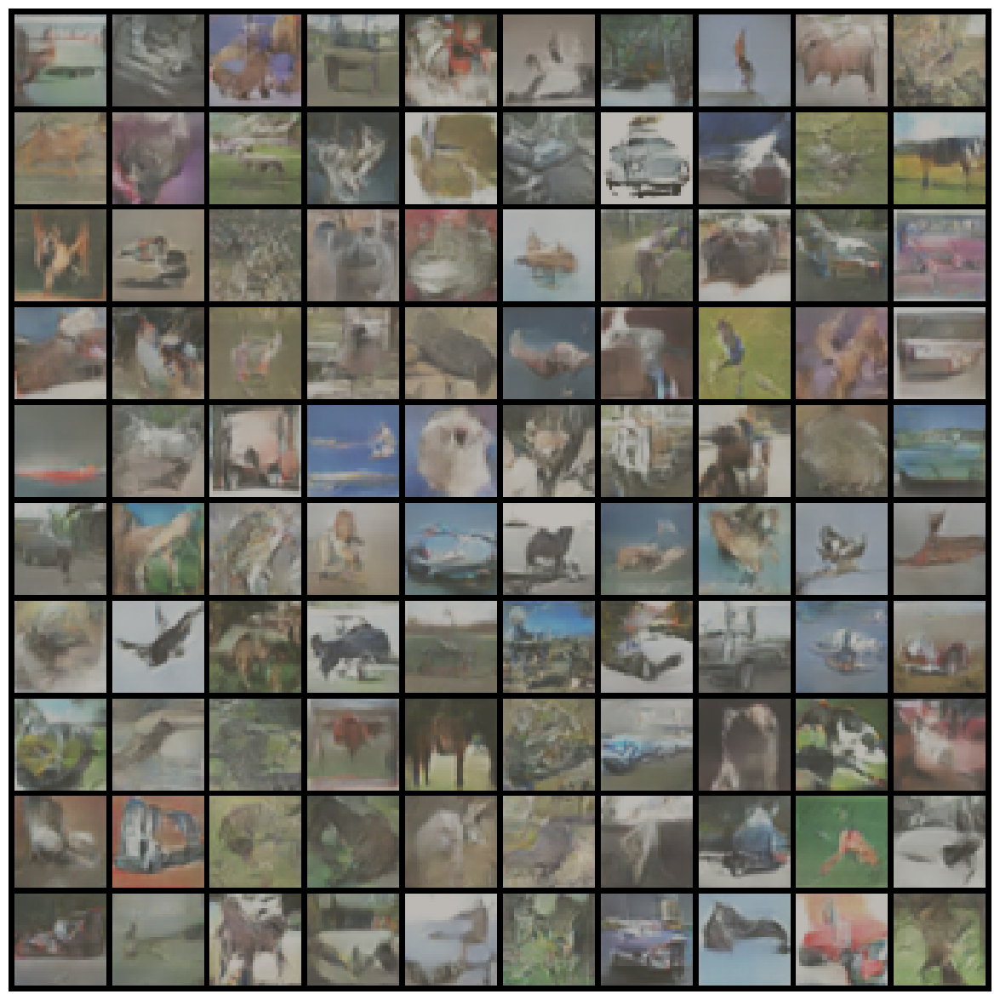

In [40]:
# GAN Tests
#model_G = torch.jit.load('./CW_GAN/GAN_G_model.pth')
model_G = torch.jit.load(content_path/'CW_GAN/GAN_G_model.pth')
#model_D = torch.jit.load('./CW_GAN/GAN_D_model.pth')
model_D = torch.jit.load(content_path/'CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False,
                    value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)